In [1]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
import plotly.express as px
# 'Statsmodels' is used to build and analyze various statistical models
import statistics

# import 'stats' package from scipy library
from scipy import stats

# import a library to perform Z-test
from statsmodels.stats import weightstats as stests

# to test the normality 
from scipy.stats import shapiro

# import the function to calculate the power of test
from statsmodels.stats import power

# import train-test split 
from sklearn.model_selection import train_test_split

# import various functions from statsmodels
import statsmodels
import statsmodels.api as sm

# import StandardScaler to perform scaling
from sklearn.preprocessing import StandardScaler 

# import various functions from sklearn 
from sklearn import metrics
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report
from sklearn.metrics import cohen_kappa_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_curve
from sklearn.metrics import accuracy_score

# import function to perform feature selection
from sklearn.feature_selection import RFE

import warnings
warnings.filterwarnings("ignore")

**Problem Statement:**
    
The goal of a credit scoring model is to classify credit applicants into two classes: the “good credit” class that is liable to reimburse the financial obligation and the “bad credit” class that should be denied credit due to the high probability of defaulting on the financial obligation.

Credit score cards are a common risk control method in the financial industry. It uses personal information and data (historical data) submitted by credit card applicants to predict the probability of future defaults and credit card borrowings. The bank can decide whether to issue a credit card to the applicant or not. Credit scores are based on historical data and it can quantify the magnitude of risk.

In [2]:
df_app = pd.read_csv("C:/Users/Ramyasridar/Downloads/archive/application_record.csv")

In [3]:
df_app.head()

,ID,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS
0,5008804,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,NaN,2.0
1,5008805,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,NaN,2.0
2,5008806,M,Y,Y,0,112500.0,Working,Secondary / secondary special,Married,House / apartment,-21474,-1134,1,0,0,0,Security staff,2.0
3,5008808,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,1,0,1,1,Sales staff,1.0
4,5008809,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,1,0,1,1,Sales staff,1.0


## DATA DEFINITION:

1. **ID:** Applicants' number


2. **CODE_GENDER:** Gender of the clients


3. **FLAG_OWN_CAR:** Is there a car


4. **FLAG_OWN_REALTY:** Is there a property


5. **CNT_CHILDREN:** Number of children


4. **AMT_INCOME_TOTAL:** Annual income


6. **NAME_INCOME_TYPE:** Income category


7. **NAME_EDUCATION_TYPE:**	 Education level


8. **NAME_FAMILY_STATUS:**	Marital status


9. **NAME_HOUSING_TYPE:** Way of living


10. **DAYS_BIRTH:**	Birthday (Count backwards from current day (0), -1 means yesterday)


11. **DAYS_EMPLOYED:**	Start date of employment (Count backwards from current day(0). If positive, it means the person currently unemployed.)


12. **FLAG_MOBIL:**	Is there a mobile phone


13. **FLAG_WORK_PHONE:** Is there a work phone


14. **FLAG_PHONE:**	Is there a phone


15. **FLAG_EMAIL:**	Is there an email


16. **OCCUPATION_TYPE:** Occupation


17. **CNT_FAM_MEMBERS:** Family size


18. **ID:**	Client number	


19. **MONTHS_BALANCE:**	Record month	The month of the extracted data is the starting point, backwards, 0 is the current month, -1 is the previous month, and so on


20. **STATUS:**	Status

    **Status-0:** 1-29 days past due 
    
    **Status-1:** 30-59 days past due
    
    **Status-2:** 60-89 days overdue 
    
    **Status-3:** 90-119 days overdue 
    
    **Status-4:** 120-149 days overdue 
    
    **Status-5:** Overdue or bad debts, write-offs for more than 150 days 
    
    **Status-C:** paid off that month 
    
    **Status-X:** No loan for the month

In [4]:
df_credit=df_app.copy()

In [5]:
df_credit.shape

(438557, 18)

**Inference:**-The data has 438557 observations and 18 variables.

In [6]:
df_credit.columns

Index(['ID', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN',
       'AMT_INCOME_TOTAL', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE',
       'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'DAYS_BIRTH',
       'DAYS_EMPLOYED', 'FLAG_MOBIL', 'FLAG_WORK_PHONE', 'FLAG_PHONE',
       'FLAG_EMAIL', 'OCCUPATION_TYPE', 'CNT_FAM_MEMBERS'],
      dtype='object')

**CHECKING DATATYPES**

In [7]:
df_credit.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 438557 entries, 0 to 438556
Data columns (total 18 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   ID                   438557 non-null  int64  
 1   CODE_GENDER          438557 non-null  object 
 2   FLAG_OWN_CAR         438557 non-null  object 
 3   FLAG_OWN_REALTY      438557 non-null  object 
 4   CNT_CHILDREN         438557 non-null  int64  
 5   AMT_INCOME_TOTAL     438557 non-null  float64
 6   NAME_INCOME_TYPE     438557 non-null  object 
 7   NAME_EDUCATION_TYPE  438557 non-null  object 
 8   NAME_FAMILY_STATUS   438557 non-null  object 
 9   NAME_HOUSING_TYPE    438557 non-null  object 
 10  DAYS_BIRTH           438557 non-null  int64  
 11  DAYS_EMPLOYED        438557 non-null  int64  
 12  FLAG_MOBIL           438557 non-null  int64  
 13  FLAG_WORK_PHONE      438557 non-null  int64  
 14  FLAG_PHONE           438557 non-null  int64  
 15  FLAG_EMAIL       

In [8]:
df_credit.select_dtypes(include=["int64","float64"]).columns

Index(['ID', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'DAYS_BIRTH', 'DAYS_EMPLOYED',
       'FLAG_MOBIL', 'FLAG_WORK_PHONE', 'FLAG_PHONE', 'FLAG_EMAIL',
       'CNT_FAM_MEMBERS'],
      dtype='object')

**INFERENCE**-
  
  *The variables 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'NAME_INCOME_TYPE',
       'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE',
       'OCCUPATION_TYPE' are in object datatypes as per the data definition.
       
  *The variables 'ID', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'DAYS_BIRTH', 'DAYS_EMPLOYED',
        'FLAG_MOBIL', 'FLAG_WORK_PHONE', 'FLAG_PHONE', 'FLAG_EMAIL'are numerical as per data defined.
        
  *The variable 'CNT_FAM_MEMBERS' according to the data definition,"CNT_FAM_MEMBERS" is a categorical variable, which is                    wrongly interpreted as 'float64', so we will convert these variables data type to 'object'.

**Checking for wrong entries like symbols -,?,#,*,etc**

In [9]:
for col in df_credit.columns:
    print('{} : {}'.format(col,df_credit[col].unique()))

ID : [5008804 5008805 5008806 ... 6841878 6842765 6842885]
CODE_GENDER : ['M' 'F']
FLAG_OWN_CAR : ['Y' 'N']
FLAG_OWN_REALTY : ['Y' 'N']
CNT_CHILDREN : [ 0  1  3  2  4  5 14 19  7  9 12  6]
AMT_INCOME_TOTAL : [ 427500.    112500.    270000.    283500.    135000.    130500.
  157500.    405000.    211500.    360000.    126000.    315000.
  247500.    297000.    225000.    166500.    216000.    255150.
  148500.    202500.     94500.    450000.    180000.     90000.
  765000.    382500.    144000.    229500.    292500.     74250.
   40500.    337500.    193500.    267750.    139500.     67500.
  252000.    900000.    115290.    279000.     76500.    234000.
   81000.    108000.     99000.    198000.     45000.    238500.
  117000.    153000.   1350000.    445500.    495000.     85500.
  306000.    562500.    189000.    328500.    310500.    540000.
  171000.    675000.    121500.     72000.     65250.    184500.
  103500.    162000.    165150.     54000.    243000.    256500.
   33300.   

DAYS_BIRTH : [-12005 -21474 -19110 ...  -8169  -9738 -22257]
DAYS_EMPLOYED : [-4542 -1134 -3051 ... -8300 -9020 -4884]
FLAG_MOBIL : [1]
FLAG_WORK_PHONE : [1 0]
FLAG_PHONE : [0 1]
FLAG_EMAIL : [0 1]
OCCUPATION_TYPE : [nan 'Security staff' 'Sales staff' 'Accountants' 'Laborers' 'Managers'
 'Drivers' 'Core staff' 'High skill tech staff' 'Cleaning staff'
 'Private service staff' 'Cooking staff' 'Low-skill Laborers'
 'Medicine staff' 'Secretaries' 'Waiters/barmen staff' 'HR staff'
 'Realty agents' 'IT staff']
CNT_FAM_MEMBERS : [ 2.  1.  5.  3.  4.  6. 15.  7. 20.  9. 11. 14.  8.]


**Change the data type as per the data definition.**

In [10]:
df_credit['CNT_FAM_MEMBERS'] = df_credit['CNT_FAM_MEMBERS'].astype('int64')

In [11]:
df_credit['CNT_FAM_MEMBERS'] = df_credit['CNT_FAM_MEMBERS'].astype('object')

In [12]:
df_credit.dtypes

ID                       int64
CODE_GENDER             object
FLAG_OWN_CAR            object
FLAG_OWN_REALTY         object
CNT_CHILDREN             int64
AMT_INCOME_TOTAL       float64
NAME_INCOME_TYPE        object
NAME_EDUCATION_TYPE     object
NAME_FAMILY_STATUS      object
NAME_HOUSING_TYPE       object
DAYS_BIRTH               int64
DAYS_EMPLOYED            int64
FLAG_MOBIL               int64
FLAG_WORK_PHONE          int64
FLAG_PHONE               int64
FLAG_EMAIL               int64
OCCUPATION_TYPE         object
CNT_FAM_MEMBERS         object
dtype: object

## Summary Statistics

In [13]:
df_credit.describe()

,ID,CNT_CHILDREN,AMT_INCOME_TOTAL,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL
count,4.385570e+05,438557.000000,4.385570e+05,438557.000000,438557.000000,438557.0,438557.000000,438557.000000,438557.000000
mean,6.022176e+06,0.427390,1.875243e+05,-15997.904649,60563.675328,1.0,0.206133,0.287771,0.108207
std,5.716370e+05,0.724882,1.100869e+05,4185.030007,138767.799647,0.0,0.404527,0.452724,0.310642
min,5.008804e+06,0.000000,2.610000e+04,-25201.000000,-17531.000000,1.0,0.000000,0.000000,0.000000
25%,5.609375e+06,0.000000,1.215000e+05,-19483.000000,-3103.000000,1.0,0.000000,0.000000,0.000000
50%,6.047745e+06,0.000000,1.607805e+05,-15630.000000,-1467.000000,1.0,0.000000,0.000000,0.000000
75%,6.456971e+06,1.000000,2.250000e+05,-12514.000000,-371.000000,1.0,0.000000,1.000000,0.000000
max,7.999952e+06,19.000000,6.750000e+06,-7489.000000,365243.000000,1.0,1.000000,1.000000,1.000000


In [14]:
df_credit.select_dtypes(include='object').columns

Index(['CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'NAME_INCOME_TYPE',
       'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE',
       'OCCUPATION_TYPE', 'CNT_FAM_MEMBERS'],
      dtype='object')

In [15]:
df_credit.select_dtypes(include='int64').columns

Index(['ID', 'CNT_CHILDREN', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'FLAG_MOBIL',
       'FLAG_WORK_PHONE', 'FLAG_PHONE', 'FLAG_EMAIL'],
      dtype='object')

##  Checking for Duplicate values

In [16]:
df_credit_duplicates=df_credit.duplicated()
print(df_credit_duplicates.sum())

0


In [17]:
df_credit[df_credit_duplicates]

,ID,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS


### Checking Duplicate on single column

In [18]:
id_dup = df_credit.duplicated(subset = 'ID').to_frame()
id_dup[id_dup[0] == True]

,0
421349,True
422660,True
423702,True
424480,True
425306,True
425724,True
426198,True
426325,True
426488,True
426665,True


### Remove duplicate values

In [19]:
len_before = df_credit.shape[0]
df_credit.drop_duplicates(subset = 'ID',inplace=True)
len_after = df_credit.shape[0]

print(f"Before = {len_before}")
print(f"After = {len_after}")
print("")
print(f"Total Removed = {len_before - len_after}")

Before = 438557
After = 438510

Total Removed = 47


there are 47 duplicate records in the column ID

In [20]:
df_credit.nunique()

ID                     438510
CODE_GENDER                 2
FLAG_OWN_CAR                2
FLAG_OWN_REALTY             2
CNT_CHILDREN               12
AMT_INCOME_TOTAL          866
NAME_INCOME_TYPE            5
NAME_EDUCATION_TYPE         5
NAME_FAMILY_STATUS          5
NAME_HOUSING_TYPE           6
DAYS_BIRTH              16379
DAYS_EMPLOYED            9406
FLAG_MOBIL                  1
FLAG_WORK_PHONE             2
FLAG_PHONE                  2
FLAG_EMAIL                  2
OCCUPATION_TYPE            18
CNT_FAM_MEMBERS            13
dtype: int64

In [21]:
df_credit.count()

ID                     438510
CODE_GENDER            438510
FLAG_OWN_CAR           438510
FLAG_OWN_REALTY        438510
CNT_CHILDREN           438510
AMT_INCOME_TOTAL       438510
NAME_INCOME_TYPE       438510
NAME_EDUCATION_TYPE    438510
NAME_FAMILY_STATUS     438510
NAME_HOUSING_TYPE      438510
DAYS_BIRTH             438510
DAYS_EMPLOYED          438510
FLAG_MOBIL             438510
FLAG_WORK_PHONE        438510
FLAG_PHONE             438510
FLAG_EMAIL             438510
OCCUPATION_TYPE        304317
CNT_FAM_MEMBERS        438510
dtype: int64

## 2. Missing values

**ANALYZING PERCENTAGE OF MISSING VALUES**

In [22]:
# get the count of missing values
missing_values = df_credit.isnull().sum()

# check for missing values
total = df_credit.isnull().sum().sort_values(ascending=False)

# calculate percentage of the missing values
percent = ((df_credit.isnull().sum()/df_credit.shape[0])*100)

# sort the values in descending order
# ascending: 
percent = percent.sort_values(ascending=False)

# concatenate the total missing values and percentage of the missing values
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])

# add the data types
missing_data['Type'] = df_credit[missing_data.index].dtypes

# view the missing data
missing_data

,Total,Percent,Type
OCCUPATION_TYPE,134193,30.602039,object
ID,0,0.000000,int64
CODE_GENDER,0,0.000000,object
FLAG_EMAIL,0,0.000000,int64
FLAG_PHONE,0,0.000000,int64
FLAG_WORK_PHONE,0,0.000000,int64
FLAG_MOBIL,0,0.000000,int64
DAYS_EMPLOYED,0,0.000000,int64
DAYS_BIRTH,0,0.000000,int64
NAME_HOUSING_TYPE,0,0.000000,object


**Inference:**

The total number of observations in the dataset is 438557. The **ID** attribute is considered to be unique columns. But it has only 438510 unique values. So duplicate values of **ID** and its observation should be dropped

In [23]:
df_credit.isnull().values.any()

True

In [24]:
missing_values = df_credit.isnull().sum()

# print the missing values
missing_values

ID                          0
CODE_GENDER                 0
FLAG_OWN_CAR                0
FLAG_OWN_REALTY             0
CNT_CHILDREN                0
AMT_INCOME_TOTAL            0
NAME_INCOME_TYPE            0
NAME_EDUCATION_TYPE         0
NAME_FAMILY_STATUS          0
NAME_HOUSING_TYPE           0
DAYS_BIRTH                  0
DAYS_EMPLOYED               0
FLAG_MOBIL                  0
FLAG_WORK_PHONE             0
FLAG_PHONE                  0
FLAG_EMAIL                  0
OCCUPATION_TYPE        134193
CNT_FAM_MEMBERS             0
dtype: int64

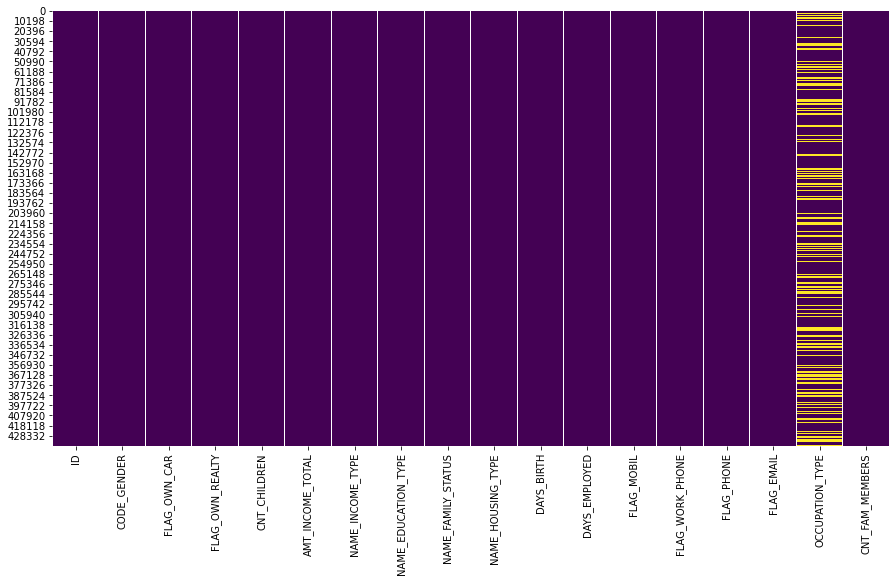

In [25]:
# set the figure size
plt.rcParams["figure.figsize"]=[15,8]

# plot a heatmap of the missing values in the data
# cbar: specify whether to display the color index or not
sns.heatmap(df_credit.isnull(), cbar = False,cmap='viridis')

# display the plot
plt.show()

#### DATA CONVERSION:

**CONVERTING DAYS_EMPLOYED to number of years:**

In [26]:
#missing value treatment
df_credit['DAYS_EMPLOYED']=np.where(df_credit['DAYS_EMPLOYED']>0,0,df_credit['DAYS_EMPLOYED'])
df_credit.head()

,ID,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS
0,5008804,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,NaN,2
1,5008805,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,NaN,2
2,5008806,M,Y,Y,0,112500.0,Working,Secondary / secondary special,Married,House / apartment,-21474,-1134,1,0,0,0,Security staff,2
3,5008808,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,1,0,1,1,Sales staff,1
4,5008809,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,1,0,1,1,Sales staff,1


In [27]:
#adding field 
df_credit['YEARS_EMPLOYED'] = abs(round(df_credit['DAYS_EMPLOYED']/365,1))
df_credit.head(10)

,ID,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,YEARS_EMPLOYED
0,5008804,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,NaN,2,12.4
1,5008805,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,NaN,2,12.4
2,5008806,M,Y,Y,0,112500.0,Working,Secondary / secondary special,Married,House / apartment,-21474,-1134,1,0,0,0,Security staff,2,3.1
3,5008808,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,1,0,1,1,Sales staff,1,8.4
4,5008809,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,1,0,1,1,Sales staff,1,8.4
5,5008810,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,1,0,1,1,Sales staff,1,8.4
6,5008811,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,1,0,1,1,Sales staff,1,8.4
7,5008812,F,N,Y,0,283500.0,Pensioner,Higher education,Separated,House / apartment,-22464,0,1,0,0,0,NaN,1,0.0
8,5008813,F,N,Y,0,283500.0,Pensioner,Higher education,Separated,House / apartment,-22464,0,1,0,0,0,NaN,1,0.0
9,5008814,F,N,Y,0,283500.0,Pensioner,Higher education,Separated,House / apartment,-22464,0,1,0,0,0,NaN,1,0.0


**CONVERTING DAYS_BIRTH to number of years:**

In [28]:
df_credit['AGE(IN_YEARS)'] = abs(round(df_credit['DAYS_BIRTH']/365,1))
df_credit.head(10)

,ID,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,YEARS_EMPLOYED,AGE(IN_YEARS)
0,5008804,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,NaN,2,12.4,32.9
1,5008805,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,NaN,2,12.4,32.9
2,5008806,M,Y,Y,0,112500.0,Working,Secondary / secondary special,Married,House / apartment,-21474,-1134,1,0,0,0,Security staff,2,3.1,58.8
3,5008808,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,1,0,1,1,Sales staff,1,8.4,52.4
4,5008809,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,1,0,1,1,Sales staff,1,8.4,52.4
5,5008810,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,1,0,1,1,Sales staff,1,8.4,52.4
6,5008811,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,1,0,1,1,Sales staff,1,8.4,52.4
7,5008812,F,N,Y,0,283500.0,Pensioner,Higher education,Separated,House / apartment,-22464,0,1,0,0,0,NaN,1,0.0,61.5
8,5008813,F,N,Y,0,283500.0,Pensioner,Higher education,Separated,House / apartment,-22464,0,1,0,0,0,NaN,1,0.0,61.5
9,5008814,F,N,Y,0,283500.0,Pensioner,Higher education,Separated,House / apartment,-22464,0,1,0,0,0,NaN,1,0.0,61.5


#### MISSING VALUE TREATMENT:

**imputation of null values in occupation field**

In [29]:
df_credit.loc[df_credit['OCCUPATION_TYPE'].isnull() , 'OCCUPATION_TYPE'] = "Others"
df_credit.head()

,ID,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,YEARS_EMPLOYED,AGE(IN_YEARS)
0,5008804,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,Others,2,12.4,32.9
1,5008805,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,Others,2,12.4,32.9
2,5008806,M,Y,Y,0,112500.0,Working,Secondary / secondary special,Married,House / apartment,-21474,-1134,1,0,0,0,Security staff,2,3.1,58.8
3,5008808,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,1,0,1,1,Sales staff,1,8.4,52.4
4,5008809,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,1,0,1,1,Sales staff,1,8.4,52.4


In [30]:
df_credit.loc[df_credit['YEARS_EMPLOYED'] == 0 , 'OCCUPATION_TYPE'] = "Unemployed"
df_credit.head(10)

,ID,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,YEARS_EMPLOYED,AGE(IN_YEARS)
0,5008804,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,Others,2,12.4,32.9
1,5008805,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,Others,2,12.4,32.9
2,5008806,M,Y,Y,0,112500.0,Working,Secondary / secondary special,Married,House / apartment,-21474,-1134,1,0,0,0,Security staff,2,3.1,58.8
3,5008808,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,1,0,1,1,Sales staff,1,8.4,52.4
4,5008809,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,1,0,1,1,Sales staff,1,8.4,52.4
5,5008810,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,1,0,1,1,Sales staff,1,8.4,52.4
6,5008811,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,1,0,1,1,Sales staff,1,8.4,52.4
7,5008812,F,N,Y,0,283500.0,Pensioner,Higher education,Separated,House / apartment,-22464,0,1,0,0,0,Unemployed,1,0.0,61.5
8,5008813,F,N,Y,0,283500.0,Pensioner,Higher education,Separated,House / apartment,-22464,0,1,0,0,0,Unemployed,1,0.0,61.5
9,5008814,F,N,Y,0,283500.0,Pensioner,Higher education,Separated,House / apartment,-22464,0,1,0,0,0,Unemployed,1,0.0,61.5


NOTE:Imputing the null values in occupation type as others and imputing null values in years employed as unemployed.

**DATA PREPROCESSING ON CREDIT RECORD DATASET**

In [31]:
df_credit_record=pd.read_csv("C:/Users/Ramyasridar/Downloads/archive/credit_record.csv")
df_credit_record.head()

,ID,MONTHS_BALANCE,STATUS
0,5001711,0,X
1,5001711,-1,0
2,5001711,-2,0
3,5001711,-3,0
4,5001712,0,C


In [32]:
df_credit_record.shape

(1048575, 3)

Inference:There are 1048575 obeservations and 3 records

In [33]:
df_credit_record.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1048575 entries, 0 to 1048574
Data columns (total 3 columns):
 #   Column          Non-Null Count    Dtype 
---  ------          --------------    ----- 
 0   ID              1048575 non-null  int64 
 1   MONTHS_BALANCE  1048575 non-null  int64 
 2   STATUS          1048575 non-null  object
dtypes: int64(2), object(1)
memory usage: 24.0+ MB


**Checking Unique values on ID field**

In [34]:
df_credit_record['ID'].nunique() 

45985

**SUMMARY STATISTICS OF NUMERICAL FEATURES**

In [35]:
df_credit_record.describe()

,ID,MONTHS_BALANCE
count,1.048575e+06,1.048575e+06
mean,5.068286e+06,-1.913700e+01
std,4.615058e+04,1.402350e+01
min,5.001711e+06,-6.000000e+01
25%,5.023644e+06,-2.900000e+01
50%,5.062104e+06,-1.700000e+01
75%,5.113856e+06,-7.000000e+00
max,5.150487e+06,0.000000e+00


In [36]:
def DataFrame_mydescribe(my_df):
    
    #DataTypes
    
    my_df_dtypes =  my_df.dtypes.to_frame().reset_index()
    my_df_dtypes.rename({'index':'Column_Name' , 0 : 'Data_type'}, axis = 'columns', inplace = True)
    
    #Unique
    
    my_df_unique =  my_df.apply(lambda x: len(x.unique())).to_frame().reset_index()
    my_df_unique.rename({'index':'Column_Name' , 0 : 'Unique_count'}, axis = 'columns', inplace = True)
    
    #Is Null and percentage
    
    my_df_isnull =  my_df.isnull().sum().to_frame().reset_index()
    my_df_isnull.rename({'index':'Column_Name' , 0 : 'Null_count'}, axis = 'columns', inplace = True)
    my_df_isnull['perc_null'] =  my_df_isnull['Null_count'] / len(my_df) * 100
    

    #Merging the above columns
    
    my_df_info = pd.merge(my_df_dtypes, my_df_unique, on = ['Column_Name'], how = 'inner').merge(my_df_isnull, on = ['Column_Name'], how = 'inner' )
    
    return(my_df_info)

In [37]:
DataFrame_mydescribe(df_credit_record)

,Column_Name,Data_type,Unique_count,Null_count,perc_null
0,ID,int64,45985,0,0.0
1,MONTHS_BALANCE,int64,61,0,0.0
2,STATUS,object,8,0,0.0


Inference:There are no null values present in the credit record dataset

In [38]:
df_credit_record.isnull().values.any()

False

In [39]:
missing_values_credit_record = df_credit_record.isnull().sum()

# print the missing values
missing_values_credit_record

ID                0
MONTHS_BALANCE    0
STATUS            0
dtype: int64

**GRAPHICAL REPRESENTATION OF THE MISSING VALUES**

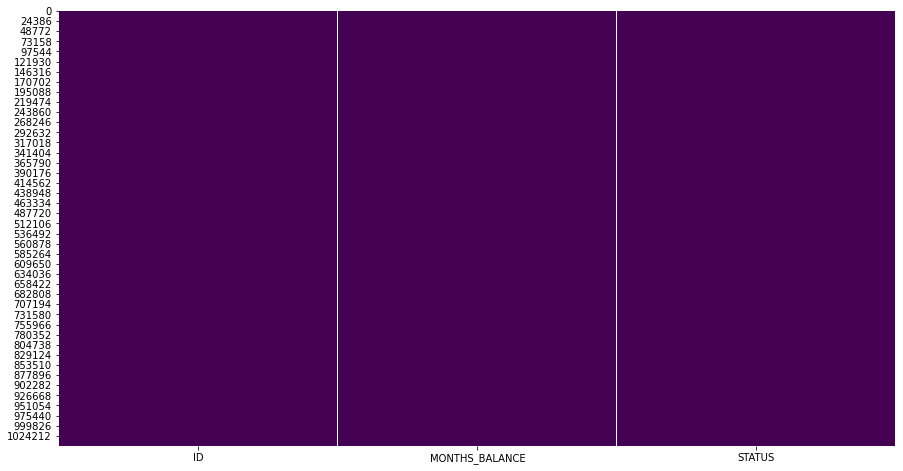

In [40]:
# set the figure size
plt.rcParams["figure.figsize"]=[15,8]

# plot a heatmap of the missing values in the data
# cbar: specify whether to display the color index or not
sns.heatmap(df_credit_record.isnull(), cbar = False,cmap='viridis')

# display the plot
plt.show()

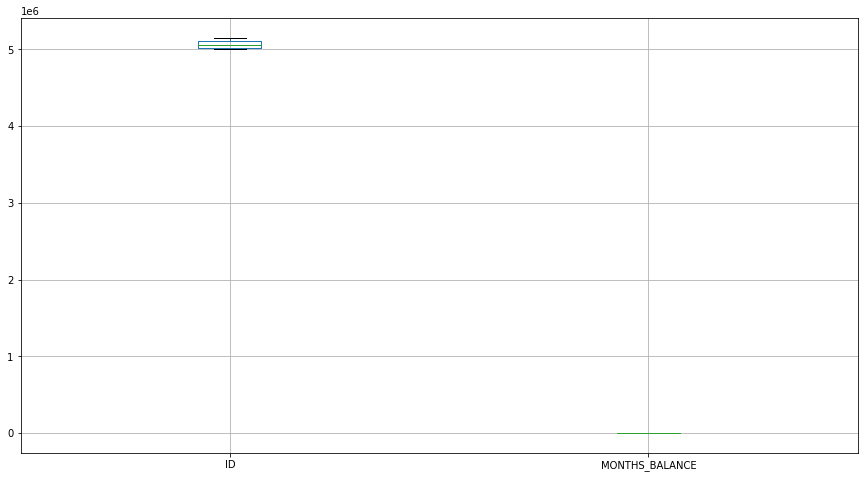

In [41]:
#box plot
plt.figure(figsize = (15,8))
df_credit_record.boxplot()
plt.show()

**CREATING TARGET VARIABE**

In [42]:
#1 - APPROVE, 0 - NOT APPROVE
map_status = {'C' : 'Good_Debt',   
'X' : 'Good_Debt',
'0' : 'Bad_Debt',
'1' : 'Bad_Debt',
'2' : 'Bad_Debt',
'3' : 'Bad_Debt',
'4' : 'Bad_Debt',
'5' : 'Bad_Debt'}

df_credit_record["STATUS"] = df_credit_record['STATUS'].map(map_status)

**Inference:**
Mapping the status C AND X as Good debt and rest of the applicants with credit due as Bad debt.

In [43]:
df_credit_record.head()

,ID,MONTHS_BALANCE,STATUS
0,5001711,0,Good_Debt
1,5001711,-1,Bad_Debt
2,5001711,-2,Bad_Debt
3,5001711,-3,Bad_Debt
4,5001712,0,Good_Debt


In [44]:
len(df_credit_record)

1048575

In [45]:
df_month_bal = df_credit_record.groupby('ID')['MONTHS_BALANCE'].count().to_frame().reset_index()
df_month_bal

,ID,MONTHS_BALANCE
0,5001711,4
1,5001712,19
2,5001713,22
3,5001714,15
4,5001715,60
...,...,...
45980,5150482,18
45981,5150483,18
45982,5150484,13
45983,5150485,2


In [46]:
df_credit_status = df_credit_record.value_counts(subset=['ID', 'STATUS']).unstack(fill_value=0).reset_index()
df_credit_status.head()

STATUS,ID,Bad_Debt,Good_Debt
0,5001711,3,1
1,5001712,10,9
2,5001713,0,22
3,5001714,0,15
4,5001715,0,60


In [47]:
df_credit_record = pd.merge(df_month_bal, df_credit_status, on = ['ID'])

In [48]:
df_credit_record.head()

,ID,MONTHS_BALANCE,Bad_Debt,Good_Debt
0,5001711,4,3,1
1,5001712,19,10,9
2,5001713,22,0,22
3,5001714,15,0,15
4,5001715,60,0,60


**MAPPING TARGET VARIABLE AS 1 AND 0**

In [49]:
df_credit_record.loc[(df_credit_record['Good_Debt'] > df_credit_record['Bad_Debt']), 'Status'] = '1'

NOTE:Imputing status as 1 wherever the Good debt greater than Bad debt.

In [50]:
df_credit_record.loc[(df_credit_record['Good_Debt'] <= df_credit_record['Bad_Debt']), 'Status'] = '0'

In [51]:
df_credit_record.head()

,ID,MONTHS_BALANCE,Bad_Debt,Good_Debt,Status
0,5001711,4,3,1,0
1,5001712,19,10,9,0
2,5001713,22,0,22,1
3,5001714,15,0,15,1
4,5001715,60,0,60,1


NOTE:Imputing status as 0 wherever the Good debt lesser than or equal to Bad debt.

**Creating Copy of dataset**

In [52]:
df_credit_record_cpy = df_credit_record.copy()

In [53]:
df_credit_record_cpy.head()

,ID,MONTHS_BALANCE,Bad_Debt,Good_Debt,Status
0,5001711,4,3,1,0
1,5001712,19,10,9,0
2,5001713,22,0,22,1
3,5001714,15,0,15,1
4,5001715,60,0,60,1


**Relative frequencies of the unique values.**

In [54]:
df_credit_record_cpy['Status'].value_counts(normalize = True)*100

1    53.617484
0    46.382516
Name: Status, dtype: float64

## MERGING BOTH DATAFRAMES

In [55]:
df = df_credit.join(df_credit_record.set_index('ID'), on='ID', how='inner')

In [56]:
df.head()

,ID,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,...,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,YEARS_EMPLOYED,AGE(IN_YEARS),MONTHS_BALANCE,Bad_Debt,Good_Debt,Status
0,5008804,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,...,0,0,Others,2,12.4,32.9,16,2,14,1
1,5008805,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,...,0,0,Others,2,12.4,32.9,15,2,13,1
2,5008806,M,Y,Y,0,112500.0,Working,Secondary / secondary special,Married,House / apartment,...,0,0,Security staff,2,3.1,58.8,30,7,23,1
3,5008808,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,...,1,1,Sales staff,1,8.4,52.4,5,2,3,1
4,5008809,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,...,1,1,Sales staff,1,8.4,52.4,5,0,5,1


In [57]:
df_org1 = df.copy() #taking a copy

In [58]:
df_org1['Status']=df_org1['Status'].astype("int64")

In [59]:
df_numeric=df_org1.select_dtypes(include=['int64','float64'])
df_numeric.columns
corr =  df_numeric.corr()

In [60]:
corr

,ID,CNT_CHILDREN,AMT_INCOME_TOTAL,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,YEARS_EMPLOYED,AGE(IN_YEARS),MONTHS_BALANCE,Bad_Debt,Good_Debt,Status
ID,1.000000,0.028878,-0.017667,0.056016,0.005745,NaN,0.079215,0.009879,-0.046979,-0.005803,-0.056026,0.017627,-0.004058,0.021076,0.023162
CNT_CHILDREN,0.028878,1.000000,0.033691,0.339357,-0.043358,NaN,0.048091,-0.016291,0.015960,0.043391,-0.339343,-0.004303,0.001296,-0.005320,0.003836
AMT_INCOME_TOTAL,-0.017667,0.033691,1.000000,0.067908,-0.087130,NaN,-0.037746,0.017245,0.086681,0.087214,-0.067911,0.025988,0.041421,0.003945,-0.005906
DAYS_BIRTH,0.056016,0.339357,0.067908,1.000000,-0.023497,NaN,0.179054,-0.028659,0.105625,0.023467,-0.999997,-0.051006,-0.041439,-0.030552,0.010899
DAYS_EMPLOYED,0.005745,-0.043358,-0.087130,-0.023497,1.000000,NaN,-0.111327,-0.043025,0.002168,-0.999992,0.023478,-0.075025,-0.049761,-0.051344,-0.012124
FLAG_MOBIL,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
FLAG_WORK_PHONE,0.079215,0.048091,-0.037746,0.179054,-0.111327,NaN,1.000000,0.311644,-0.034838,0.111402,-0.179058,0.021536,0.004586,0.020288,0.016719
FLAG_PHONE,0.009879,-0.016291,0.017245,-0.028659,-0.043025,NaN,0.311644,1.000000,0.010455,0.043084,0.028671,0.019302,0.019147,0.009578,0.002460
FLAG_EMAIL,-0.046979,0.015960,0.086681,0.105625,0.002168,NaN,-0.034838,0.010455,1.000000,-0.002130,-0.105635,0.009776,0.022118,-0.002257,0.000297
YEARS_EMPLOYED,-0.005803,0.043391,0.087214,0.023467,-0.999992,NaN,0.111402,0.043084,-0.002130,1.000000,-0.023448,0.074999,0.049722,0.051338,0.012122


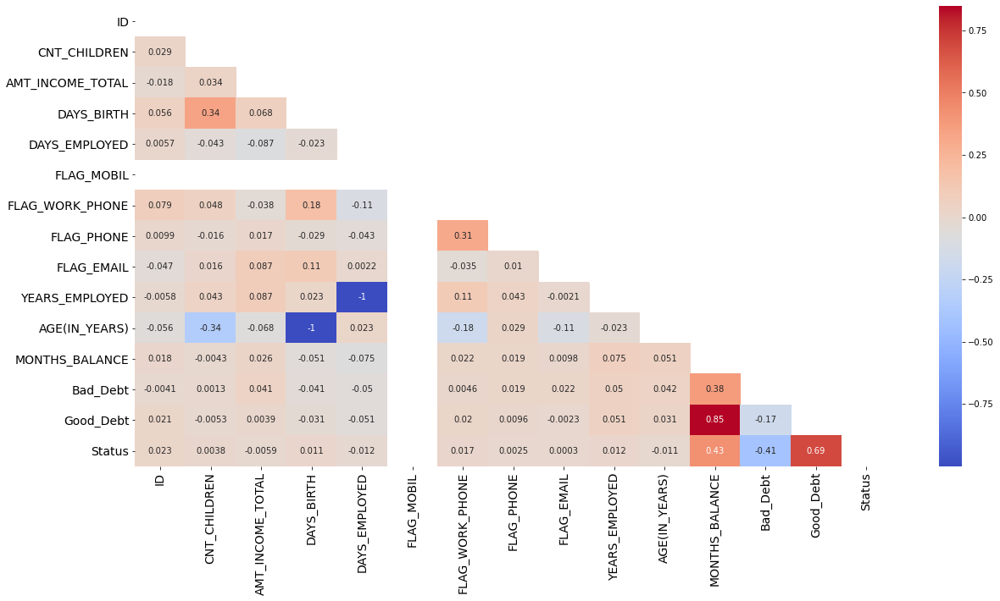

In [61]:
# print the correlation matrix

mask=np.zeros_like(corr)
triange_indices=np.triu_indices_from(mask)
mask[triange_indices] = True
plt.figure(figsize = (20,10))
sns.heatmap(corr,mask=mask,annot = True, cmap = 'coolwarm')
plt.xticks(fontsize=14) 
plt.yticks(fontsize=14) 
plt.show()

**Inference:** 

The above results shows that there is no strong correlation between any of the features but there exist a moderate between few features.

The status (target) is derived from the good debt and bad debt so correlation cannot be interpret between status and good or bad debt feature.

**Remove Insignificant Variables**

In [62]:
df = df.drop(['FLAG_MOBIL', 'FLAG_WORK_PHONE', 'FLAG_PHONE', 'FLAG_EMAIL', 'CNT_CHILDREN', 'DAYS_BIRTH', 'DAYS_EMPLOYED','Bad_Debt','Good_Debt'], axis =1)

In [63]:
df.head()

,ID,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,OCCUPATION_TYPE,CNT_FAM_MEMBERS,YEARS_EMPLOYED,AGE(IN_YEARS),MONTHS_BALANCE,Status
0,5008804,M,Y,Y,427500.0,Working,Higher education,Civil marriage,Rented apartment,Others,2,12.4,32.9,16,1
1,5008805,M,Y,Y,427500.0,Working,Higher education,Civil marriage,Rented apartment,Others,2,12.4,32.9,15,1
2,5008806,M,Y,Y,112500.0,Working,Secondary / secondary special,Married,House / apartment,Security staff,2,3.1,58.8,30,1
3,5008808,F,N,Y,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,Sales staff,1,8.4,52.4,5,1
4,5008809,F,N,Y,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,Sales staff,1,8.4,52.4,5,1


**Renaming the columns**

In [64]:
df.rename(columns = { 'ID' : 'id', 'CODE_GENDER' : 'gender', 'FLAG_OWN_CAR' : 'own_car', 'FLAG_OWN_REALTY' : 'own_house', 
                     'AMT_INCOME_TOTAL' : 'income' , 'NAME_INCOME_TYPE' : 'income_type' , 'NAME_EDUCATION_TYPE' : 'education', 'NAME_FAMILY_STATUS' : 'family_status',
                      'NAME_HOUSING_TYPE' : 'housing_type', 'OCCUPATION_TYPE' : 'occupation_type', 
                    'CNT_FAM_MEMBERS' : 'count_fam_mem' , 'AGE(IN_YEARS)' : 'age' , 'YEARS_EMPLOYED' : 'years_employed', 'Status' : 'status', 'MONTHS_BALANCE' : 'total_due_months'} , inplace = True)
df.head()

,id,gender,own_car,own_house,income,income_type,education,family_status,housing_type,occupation_type,count_fam_mem,years_employed,age,total_due_months,status
0,5008804,M,Y,Y,427500.0,Working,Higher education,Civil marriage,Rented apartment,Others,2,12.4,32.9,16,1
1,5008805,M,Y,Y,427500.0,Working,Higher education,Civil marriage,Rented apartment,Others,2,12.4,32.9,15,1
2,5008806,M,Y,Y,112500.0,Working,Secondary / secondary special,Married,House / apartment,Security staff,2,3.1,58.8,30,1
3,5008808,F,N,Y,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,Sales staff,1,8.4,52.4,5,1
4,5008809,F,N,Y,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,Sales staff,1,8.4,52.4,5,1


In [65]:
#Initiaaly changing it to object

In [66]:
df['status'] = df['status'].astype('object')

In [67]:
df_org2 = df.copy()  #Taking a copy in this stage because category types are mapped with condition for encoding purpose

In [68]:
df.shape

(36457, 15)

In [69]:
df.dtypes

id                    int64
gender               object
own_car              object
own_house            object
income              float64
income_type          object
education            object
family_status        object
housing_type         object
occupation_type      object
count_fam_mem        object
years_employed      float64
age                 float64
total_due_months      int64
status               object
dtype: object

In [70]:
df.describe()

,id,income,years_employed,age,total_due_months
count,3.645700e+04,3.645700e+04,36457.000000,36457.000000,36457.000000
mean,5.078227e+06,1.866857e+05,6.027973,43.767916,21.332392
std,4.187524e+04,1.017892e+05,6.484278,11.508464,14.911849
min,5.008804e+06,2.700000e+04,0.000000,20.500000,1.000000
25%,5.042028e+06,1.215000e+05,1.100000,34.100000,9.000000
50%,5.074614e+06,1.575000e+05,4.300000,42.600000,18.000000
75%,5.115396e+06,2.250000e+05,8.600000,53.300000,31.000000
max,5.150487e+06,1.575000e+06,43.000000,68.900000,61.000000


**Relative frequency of Target variable Distribution**

In [71]:
df['status'].value_counts(normalize = True)*100

1    51.894012
0    48.105988
Name: status, dtype: float64

## CHECKING OUTLIERS PRESENT IN DATA


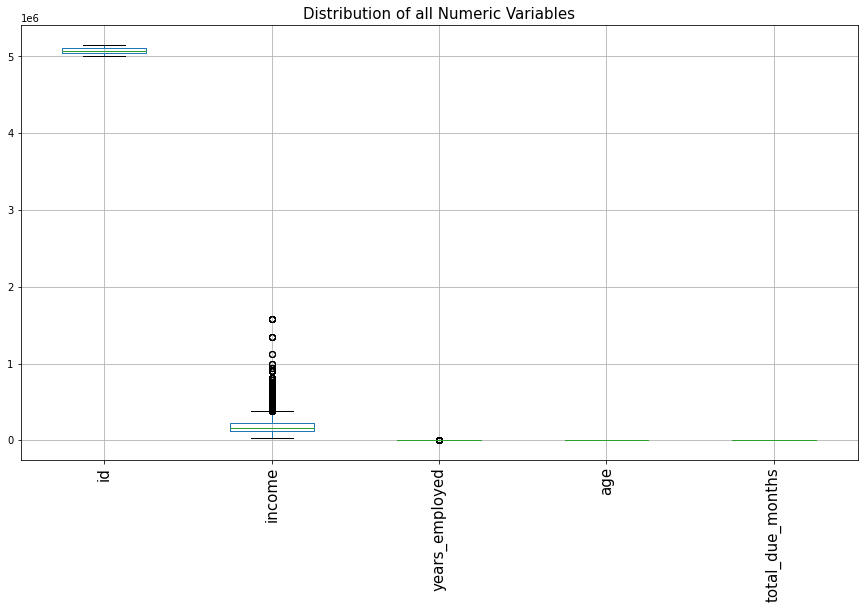

In [72]:
# set the plot size using figure()c
# pass width and height in inches to 'figsize' 
plt.figure(figsize = (15,8))

# plot a boxplot to visualize the outliers in all the numeric variables
df.boxplot()

# set plot label
# set text size using 'fontsize'
plt.title('Distribution of all Numeric Variables', fontsize = 15)

# xticks() returns the x-axis ticks
# 'rotation = vertical' rotates the x-axis labels vertically
plt.xticks(rotation = 'vertical', fontsize = 15)

# display the plot
plt.show()

In [73]:
df.shape

(36457, 15)

In [74]:
df.select_dtypes(include=['int64','float64']).columns

Index(['id', 'income', 'years_employed', 'age', 'total_due_months'], dtype='object')

**Box Plot for each column:**

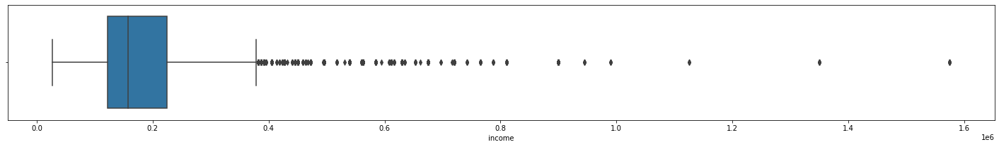

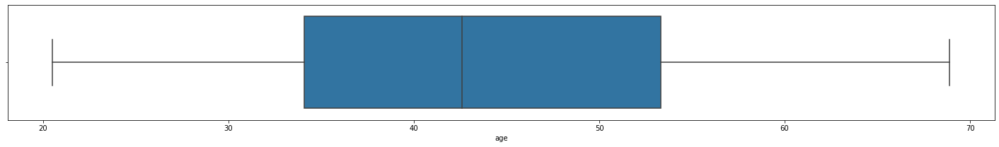

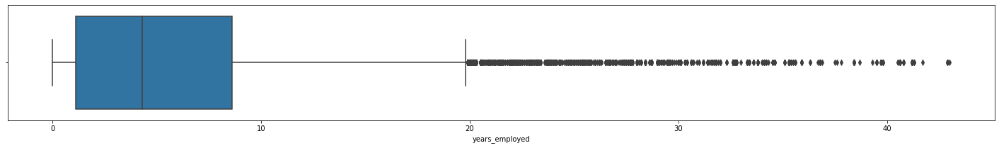

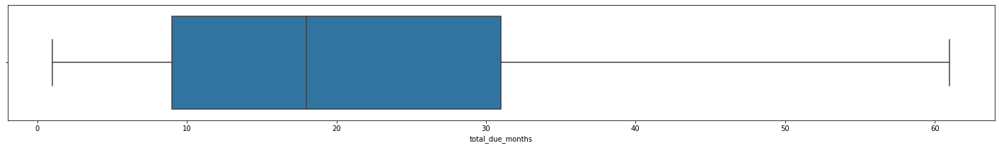

In [75]:
plt.figure(figsize = (25,3))
sns.boxplot(df['income'])

plt.figure(figsize = (25,3))
sns.boxplot(df['age'])

plt.figure(figsize = (25,3))
sns.boxplot(df['years_employed'])

plt.figure(figsize = (25,3))
sns.boxplot(df['total_due_months'])

plt.show()

**OUTLIER PERCENTAGE FOR EACH COLUMNS:**

In [76]:
len(df)

36457

**Income**

In [77]:
Q1_income = df['income'].quantile(0.25)
Q3_income = df['income'].quantile(0.75)
IQR_income = Q3_income - Q1_income

UL_income = Q1_income + 1.5*IQR_income
LL_income = Q1_income - 1.5*IQR_income

n_income_outlier = df[(df['income']<(Q1_income - 1.5*IQR_income)) | (df['income']>(Q3_income + 1.5*IQR_income))]['id'].count()

print("Number of outliers for the column income: ", n_income_outlier)
print("Percentage of Outlier exsistence for the column income :", n_income_outlier/len(df)*100)


Number of outliers for the column income:  1529
Percentage of Outlier exsistence for the column income : 4.193981951339935


**TREATING OUTLIER PRESENT IN INCOME VARIABLE**

In [78]:
#Upper Limit
df['income'] = np.where(df['income'] > UL_income, UL_income, df['income'])

#Lower Limit
df['income'] = np.where(df['income'] < LL_income, LL_income, df['income'])


**Age**

In [79]:
Q1_age = df['age'].quantile(0.25)
Q3_age = df['age'].quantile(0.75)
IQR_age = Q3_age - Q1_age

IQR_age = Q3_age - Q1_age

UL_age = Q1_age + 1.5*IQR_age
LL_age = Q1_age - 1.5*IQR_age


n_age = df[(df['age'] < (Q1_age- 1.5*IQR_age)) | (df['age'] > (Q3_age + 1.5*IQR_age))]['id'].count()

print("Number of outliers for the column age : ", n_age)
print("Percentage of Outlier exsistence for the column age :", n_age/len(df)*100)

Number of outliers for the column age :  0
Percentage of Outlier exsistence for the column age : 0.0


**Years_employed**

In [80]:
Q1_YE = df['years_employed'].quantile(0.25)
Q3_YE = df['years_employed'].quantile(0.75)
IQR_YE = Q3_YE - Q1_YE

IQR_YE = Q3_YE - Q1_YE

UL_YE = Q1_YE + 1.5*IQR_YE
LL_YE = Q1_YE - 1.5*IQR_YE


n_YE = df[(df['years_employed'] < (Q1_YE - 1.5*IQR_YE)) | (df['years_employed'] > (Q3_YE + 1.5*IQR_YE))]['id'].count()

print("Number of outliers for the column years_employed : ", n_YE)
print("Percentage of Outlier exsistence for the column years_employed :", n_YE/len(df)*100)


Number of outliers for the column years_employed :  1810
Percentage of Outlier exsistence for the column years_employed : 4.964752996681022


**TREATING OUTLIER PRESENT IN Years_employed VARIABLE**

In [81]:
#Upper Limit
df['years_employed'] = np.where(df['years_employed'] > UL_YE, UL_YE, df['years_employed'])

#Lower Limit
df['years_employed'] = np.where(df['years_employed'] < LL_YE, LL_YE, df['years_employed'])


**total_months_due**

In [82]:
Q1_TMD = df['total_due_months'].quantile(0.25)
Q3_TMD = df['total_due_months'].quantile(0.75)
IQR_TMD = Q3_TMD - Q1_TMD

IQR_TMD = Q3_TMD - Q1_TMD

UL_TMD = Q1_TMD + 1.5*IQR_TMD
LL_TMD = Q1_TMD - 1.5*IQR_TMD


n_TMD = df[(df['total_due_months'] < (Q1_TMD - 1.5*IQR_TMD)) | (df['total_due_months'] > (Q3_TMD + 1.5*IQR_TMD))]['id'].count()

print("Number of outliers for the column total_due_months : ", n_TMD)
print("Percentage of Outlier exsistence for the column total_due_months :", n_TMD/len(df)*100)


Number of outliers for the column total_due_months :  0
Percentage of Outlier exsistence for the column total_due_months : 0.0


## GRAPHICAL REPRESENTATION AFTER TREATING OUTLIERS.

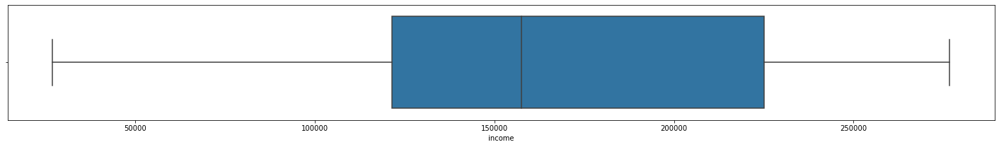

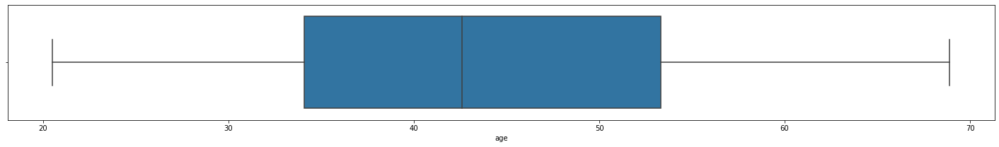

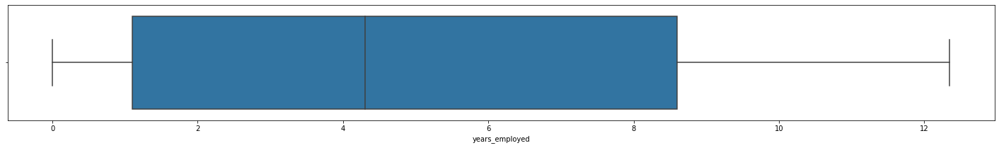

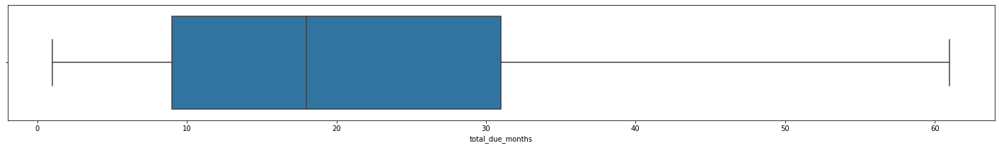

In [83]:
plt.figure(figsize = (25,3))
sns.boxplot(df['income'])

plt.figure(figsize = (25,3))
sns.boxplot(df['age'])

plt.figure(figsize = (25,3))
sns.boxplot(df['years_employed'])

plt.figure(figsize = (25,3))
sns.boxplot(df['total_due_months'])

plt.show()

## Univariate Analysis

**Categorical Features**

In [84]:
df.columns

Index(['id', 'gender', 'own_car', 'own_house', 'income', 'income_type',
       'education', 'family_status', 'housing_type', 'occupation_type',
       'count_fam_mem', 'years_employed', 'age', 'total_due_months', 'status'],
      dtype='object')

**gender, own_car, own_house**

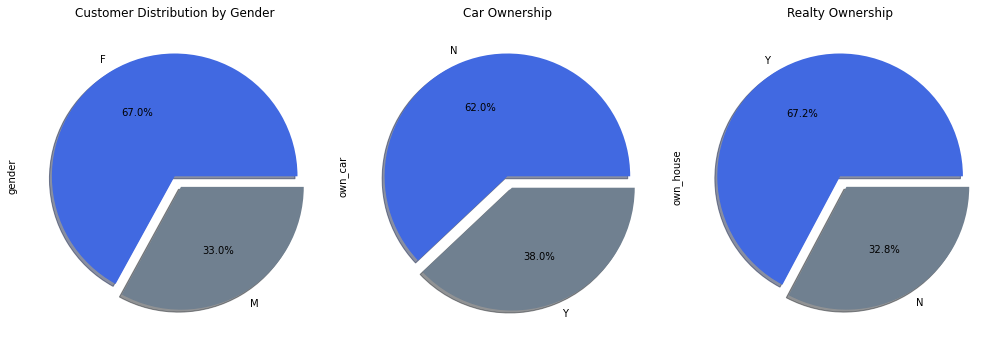

In [85]:
fig, axes = plt.subplots(1,3)

colors = ("royalblue","slategrey")

g1= df['gender'].value_counts().plot.pie(colors=colors,explode=[0,0.1],autopct='%1.1f%%',shadow=True, ax=axes[0])
g1.set_title("Customer Distribution by Gender")

g2= df['own_car'].value_counts().plot.pie(colors=colors,explode=[0,0.1],autopct='%1.1f%%',shadow=True, ax=axes[1])
g2.set_title("Car Ownership")

g3= df['own_house'].value_counts().plot.pie(colors=colors,explode=[0,0.1],autopct='%1.1f%%',shadow=True, ax=axes[2])
g3.set_title("Realty Ownership")

fig.set_size_inches(14,5)

plt.tight_layout()

plt.show()

**Inference:**

*Number of male applicants is higher than the female customers

*The number of female applicants are more than number of male applicants.

*The percentage of female applicants is 67% and the male is 33%

*Count is nearly 12k for male and 24.5k for female applicants

*Most of the applicants does not own a car , only few owns the car

*Most of applicants has own house

**income_type,	education, family_status ,housing_type ,occupation_type, count_fam_mem**

In [86]:
df.select_dtypes(include='object').columns

Index(['gender', 'own_car', 'own_house', 'income_type', 'education',
       'family_status', 'housing_type', 'occupation_type', 'count_fam_mem',
       'status'],
      dtype='object')

In [87]:
df.select_dtypes(include=['int64','float64']).columns

Index(['id', 'income', 'years_employed', 'age', 'total_due_months'], dtype='object')

In [88]:
plt.rcParams['figure.figsize'] = [15,8]

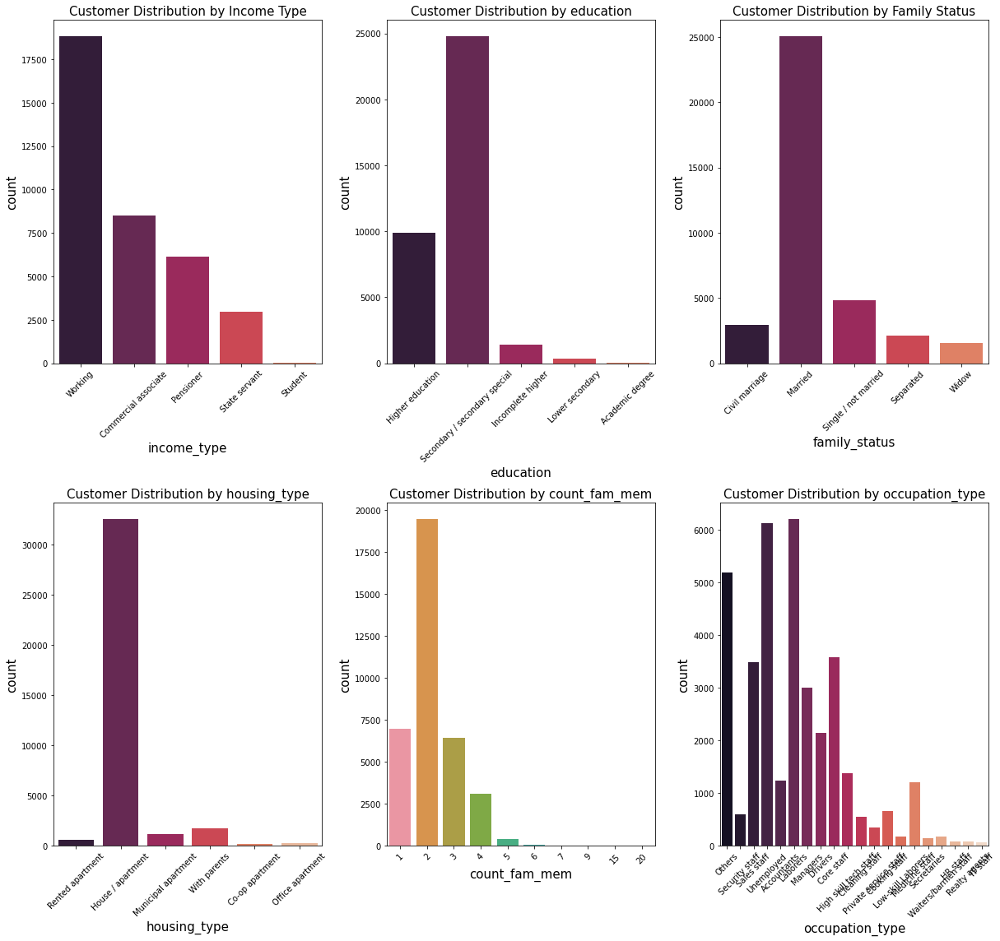

In [89]:
fig, axes = plt.subplots(2,3)
plt.subplots_adjust(hspace = 3)

axes = axes.flatten()

sns.set_palette("rocket")

g1=sns.countplot(df['income_type'],linewidth=1.2, ax=axes[0])
g1.set_title("Customer Distribution by Income Type",fontsize = 15)
g1.set_xlabel(g1.get_xlabel() , fontsize = 15)
g1.set_ylabel(g1.get_ylabel() , fontsize = 15)
g1.set_xticklabels(g1.get_xticklabels(), rotation=45)

g2=sns.countplot(df['education'],linewidth=1.2, ax=axes[1])
g2.set_title("Customer Distribution by education",fontsize = 15)
g2.set_xlabel(g2.get_xlabel() , fontsize = 15)
g2.set_ylabel(g2.get_ylabel() , fontsize = 15)
g2.set_xticklabels(g2.get_xticklabels(), rotation=45)


g3=sns.countplot(df['family_status'],linewidth=1.2, ax=axes[2])
g3.set_title("Customer Distribution by Family Status",fontsize = 15)
g3.set_xlabel(g3.get_xlabel() , fontsize = 15)
g3.set_ylabel(g3.get_ylabel() , fontsize = 15)
g3.set_xticklabels(g3.get_xticklabels(), rotation=45)


g4=sns.countplot(df['housing_type'],linewidth=1.2, ax=axes[3])
g4.set_title("Customer Distribution by housing_type",fontsize = 15)
g4.set_xlabel(g4.get_xlabel() , fontsize = 15)
g4.set_ylabel(g4.get_ylabel() , fontsize = 15)
g4.set_xticklabels(g4.get_xticklabels(), rotation=45)


g5=sns.countplot(df['count_fam_mem'],linewidth=1.2, ax=axes[4])
g5.set_title("Customer Distribution by count_fam_mem",fontsize = 15)
g5.set_xlabel(g5.get_xlabel() , fontsize = 15)
g5.set_ylabel(g5.get_ylabel() , fontsize = 15)
g5.set_xticklabels(g5.get_xticklabels(), rotation=45)


g6=sns.countplot(df['occupation_type'],linewidth=1.2, ax=axes[5],palette="rocket")
g6.set_title("Customer Distribution by occupation_type",fontsize = 15)
g6.set_xlabel(g6.get_xlabel() , fontsize = 15)
g6.set_ylabel(g6.get_ylabel() , fontsize = 15)
g6.set_xticklabels(g6.get_xticklabels(), rotation=45)


fig.set_size_inches(17,16)

plt.tight_layout()

plt.show()

**Inference:**

** The working professionals **income_type** of the are high in  compared to other category types (Working, Commercial associate, State Servant). Whereas the State Servant professionals are low in number

** The maximum number of applicants has the **education** qualification upto Secondary level when compared to other education types

** The majority of the applicants' **family_status** is married

** Majority of the applicants owns a House/Apartment **(housing_type)**

** The family count of most of the applicants are 2 followed by 1,3,4 and 5 **(count_fam_mem)**

** For most of the applicants the **Occupation type** is Laborers and unknown category (Others). Also more number of applicants are Un-employed

**Numerical Features**

In [90]:
fig1 = px.box(df, x="income")
fig1.show()

fig2 = px.box(df, x="years_employed")
fig2.show()

fig3 = px.box(df, x="age")
fig3.show()

fig4 = px.box(df, x="total_due_months")
fig4.show()

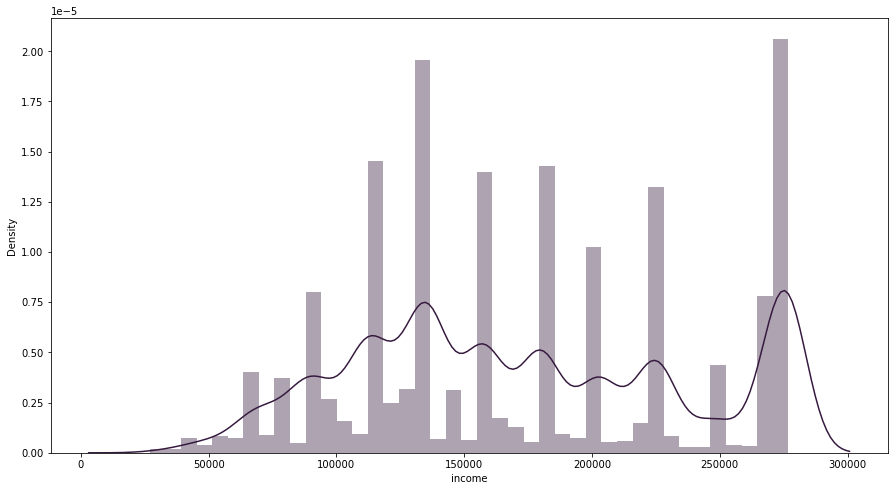

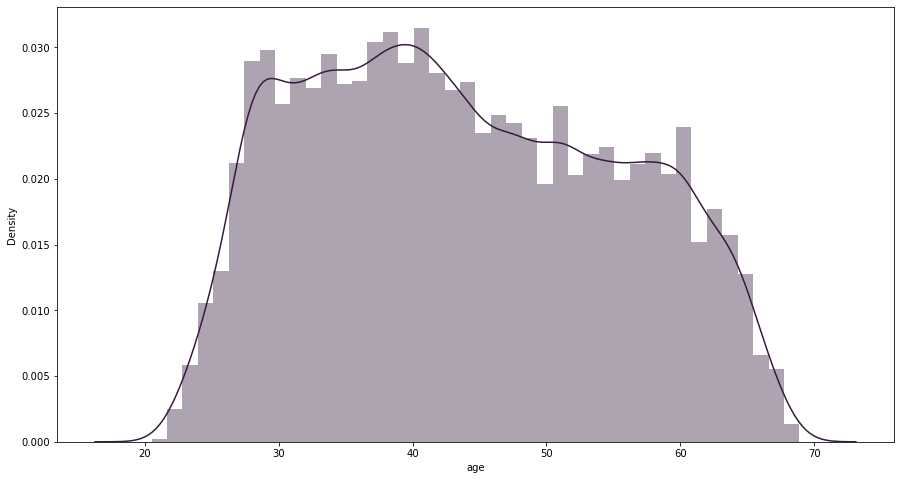

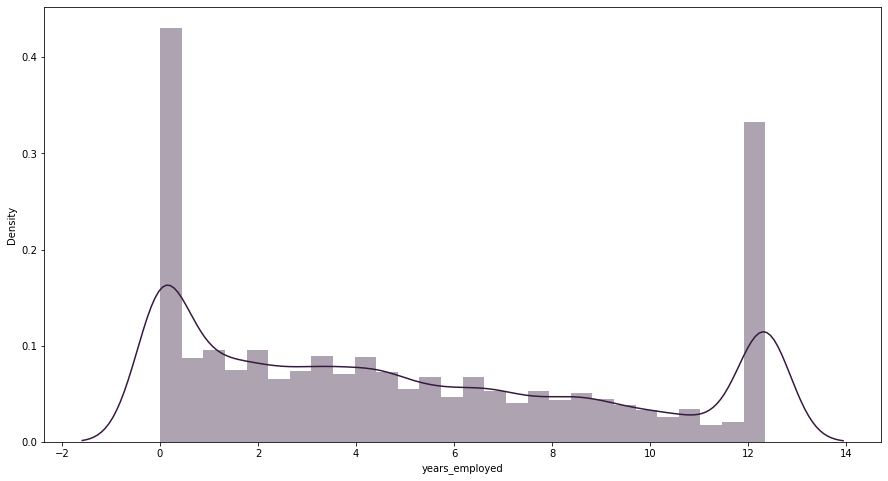

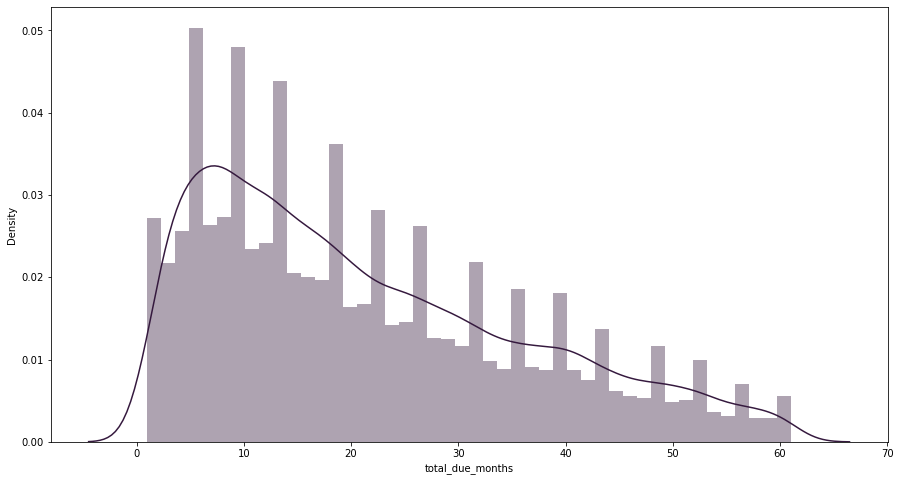

In [91]:
sns.set_palette("rocket")

sns.distplot(df['income'])
matplotlib.rc('xtick', labelsize=10) 
matplotlib.rc('ytick', labelsize=10)
plt.show()

sns.distplot(df['age'])
matplotlib.rc('xtick', labelsize=10) 
matplotlib.rc('ytick', labelsize=10)
plt.show()

sns.distplot(df['years_employed'])
matplotlib.rc('xtick', labelsize=10) 
matplotlib.rc('ytick', labelsize=10)
plt.show()

sns.distplot(df['total_due_months'])
matplotlib.rc('xtick', labelsize=10) 
matplotlib.rc('ytick', labelsize=10)
plt.show()

In [92]:
df[['income' , 'age' , 'years_employed', 'total_due_months']].agg(["count", "min", "max", "median", "mean", "skew"])

,income,age,years_employed,total_due_months
count,36457.000000,36457.000000,36457.000000,36457.000000
min,27000.000000,20.500000,0.000000,1.000000
max,276750.000000,68.900000,12.350000,61.000000
median,157500.000000,42.600000,4.300000,18.000000
mean,173219.006076,43.767916,5.117362,21.332392
skew,0.182629,0.184184,0.436813,0.730050


**Inference:**

**Age**

* The Age distribution is slightly skewed towards the right i.e. “Positive Skew”

* The distribution of age ranges from 20 years to 62 years among several distinct groups.

* The mean and median of the applicants' age is nearly 42 years

**Income**

* The distribution of income is slightly skewed towards the right i.e. “Positive Skew”

* The income of the applicants ranges from 27k to 276.75k. 

* The median income of the applicants is 157.5k and mean income of the applicants is 173.2k


**Employment years**

* The distribution of Employment years is highly skewed towards the right

* The Employment years of the applicants ranges from 0 to 12 years. 


**All the three numeric features (age, income, years_employed) are positively skewed

**For the positively skewed distribution, we see that the median in the boxplot is towards the first quartile. 

**The points beyond the whiskers of the boxplot are considered to be outliers




In [93]:
df.head()

,id,gender,own_car,own_house,income,income_type,education,family_status,housing_type,occupation_type,count_fam_mem,years_employed,age,total_due_months,status
0,5008804,M,Y,Y,276750.0,Working,Higher education,Civil marriage,Rented apartment,Others,2,12.35,32.9,16,1
1,5008805,M,Y,Y,276750.0,Working,Higher education,Civil marriage,Rented apartment,Others,2,12.35,32.9,15,1
2,5008806,M,Y,Y,112500.0,Working,Secondary / secondary special,Married,House / apartment,Security staff,2,3.10,58.8,30,1
3,5008808,F,N,Y,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,Sales staff,1,8.40,52.4,5,1
4,5008809,F,N,Y,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,Sales staff,1,8.40,52.4,5,1


In [94]:
df.select_dtypes(include=['int64','float64']).columns

Index(['id', 'income', 'years_employed', 'age', 'total_due_months'], dtype='object')

In [95]:
df.select_dtypes(include=['object']).columns

Index(['gender', 'own_car', 'own_house', 'income_type', 'education',
       'family_status', 'housing_type', 'occupation_type', 'count_fam_mem',
       'status'],
      dtype='object')

**Analyzing numerical variables using correlation matrix**

In [96]:
df_numeric_features=df.select_dtypes(include=['int64','float64'])
df_numeric_features.columns

Index(['id', 'income', 'years_employed', 'age', 'total_due_months'], dtype='object')

In [97]:
# generate the correlation matrix
corr =  df_numeric_features.corr()

# print the correlation matrix
corr

,id,income,years_employed,age,total_due_months
id,1.000000,-0.027118,0.000965,-0.056026,0.017627
income,-0.027118,1.000000,0.139762,-0.102072,0.033106
years_employed,0.000965,0.139762,1.000000,-0.143857,0.081263
age,-0.056026,-0.102072,-0.143857,1.000000,0.051023
total_due_months,0.017627,0.033106,0.081263,0.051023,1.000000


In [98]:
mask=np.zeros_like(corr)
triange_indices=np.triu_indices_from(mask)
mask[triange_indices] = True

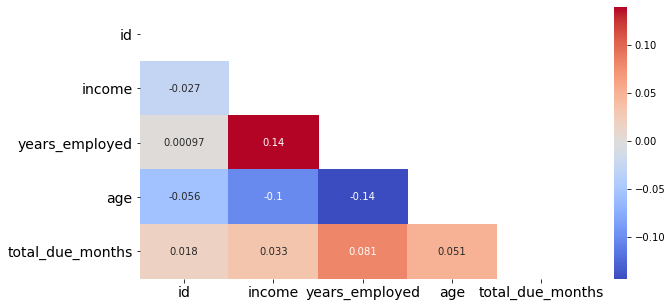

In [99]:
plt.figure(figsize = (10,5))
sns.heatmap(corr,mask=mask,annot = True, cmap = 'coolwarm')
plt.xticks(fontsize=14) 
plt.yticks(fontsize=14) 
plt.show()

## Bivariate Analysis

**RELATION BETWEEN CATEGORICAL AND TARGET VARIABLE**

### **Relation between gender and status variable**

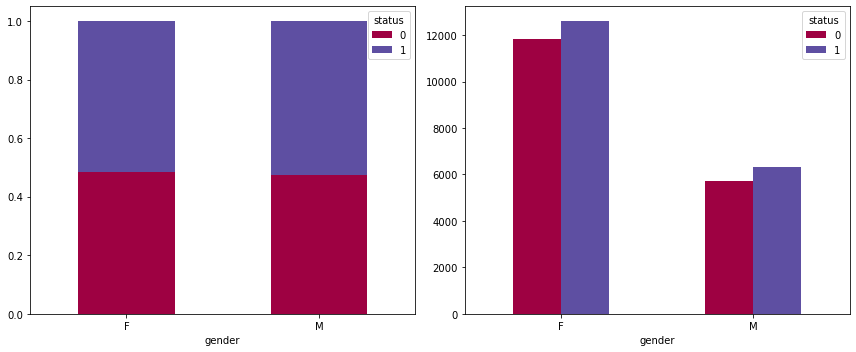

In [100]:
fig, axes = plt.subplots(1,2)

g1=pd.crosstab(df['gender'], df['status'],normalize='index').plot(kind = 'bar',stacked = True,colormap='Spectral', ax=axes[0])
g1.set_xticklabels(g1.get_xticklabels(), rotation=360)

g2=pd.crosstab(df['gender'], df['status']).plot(kind = 'bar',colormap='Spectral', ax=axes[1])
g2.set_xticklabels(g2.get_xticklabels(), rotation=360)

fig.set_size_inches(12,5)

plt.tight_layout()

plt.show()

In [101]:
pd.crosstab(df['gender'], df['status'],normalize='index')

status,0,1
gender,,
F,0.483954,0.516046
M,0.475181,0.524819


**INFERENCE:**

1)The count of male and female applicants has equal proportion on credit worthiness,so there is no significant relation between gender and  credit approval('status',target variable).

### **Relation between own_car and status variable**

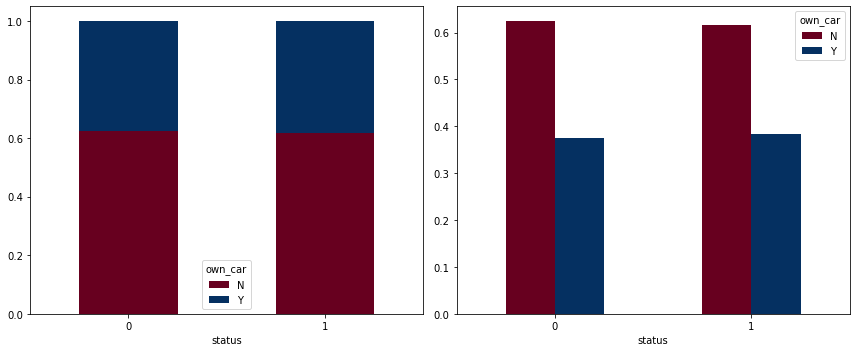

In [102]:
fig, axes = plt.subplots(1,2)

g1=pd.crosstab( df['status'] , df['own_car'],normalize='index').plot(kind = 'bar',colormap='RdBu', stacked = True,ax=axes[0])
g1.set_xticklabels(g1.get_xticklabels(), rotation=360)

g2=pd.crosstab( df['status'] , df['own_car'],normalize='index').plot(kind = 'bar',colormap='RdBu',ax=axes[1])
g2.set_xticklabels(g2.get_xticklabels(), rotation=360)

fig.set_size_inches(12,5)

plt.tight_layout()

plt.show()

In [103]:
pd.crosstab(df['own_car'], df['status'],normalize='index')

status,0,1
own_car,,
N,0.484390,0.515610
Y,0.475619,0.524381


**INFERENCE**

1)The count of applicants who owns a car are having equal propotion on their credit worthiness,so there is no significant relation between applicants with own car and credit approval ('status',target variable).

**Relation between own_house and status variable**

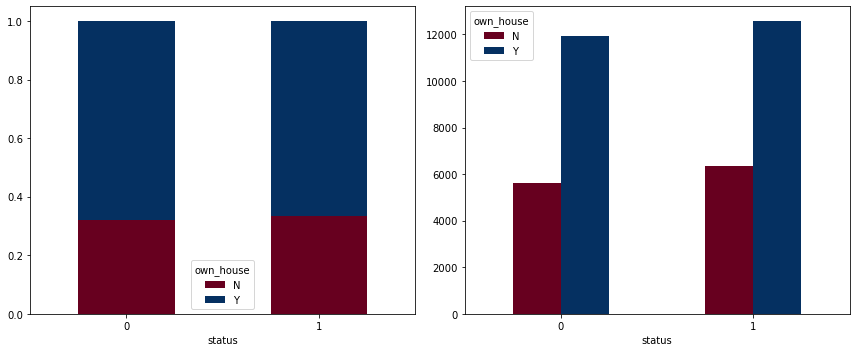

In [104]:
fig, axes = plt.subplots(1,2)

g1=pd.crosstab( df['status'] , df['own_house'],normalize='index').plot(kind = 'bar', stacked = True,colormap='RdBu', ax=axes[0])
g1.set_xticklabels(g1.get_xticklabels(), rotation=360)

g2=pd.crosstab( df['status'] , df['own_house']).plot(kind = 'bar',colormap='RdBu', ax=axes[1])
g2.set_xticklabels(g2.get_xticklabels(), rotation=360)

fig.set_size_inches(12,5)

plt.tight_layout()

plt.show()

**INFERENCE**

1)The count of applicants with the own house have higher credit worthiness,so there may be a significant relation between applicants with own house and credit approval ('status',target variable).

### **Relation between income_type and status variable**

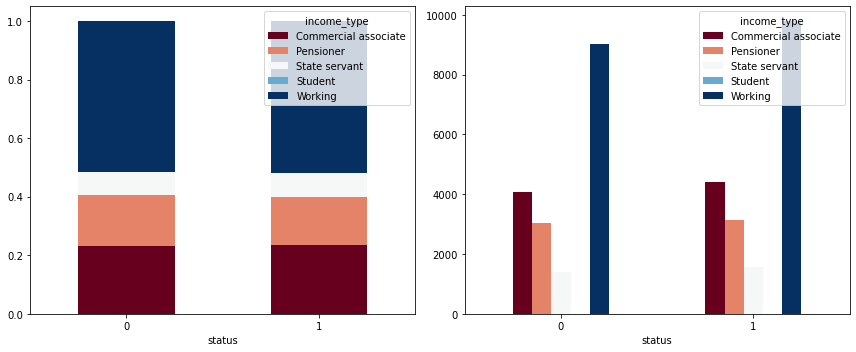

In [105]:
fig, axes = plt.subplots(1,2)

g1=pd.crosstab( df['status'] , df['income_type'],normalize='index').plot(kind = 'bar', stacked = True,colormap='RdBu', ax=axes[0])
g1.set_xticklabels(g1.get_xticklabels(), rotation=360)

g2=pd.crosstab( df['status'] , df['income_type']).plot(kind = 'bar',colormap='RdBu', ax=axes[1])
g2.set_xticklabels(g2.get_xticklabels(), rotation=360)

fig.set_size_inches(12,5)

plt.tight_layout()

plt.show()

**INFERENCE**

1)The working professionals income type have more credit worthiness,so there may be a significant relation between applicants with own house and credit approval ('status',target variable).

In [106]:
df['income_type'].value_counts()

Working                 18819
Commercial associate     8490
Pensioner                6152
State servant            2985
Student                    11
Name: income_type, dtype: int64

**NOTE-The number of Student is very less so we are dropping records related to the students income type**

In [107]:
df.drop(df[(df['income_type'] =='Student')].index, inplace=True) #dropping rows 

**Stacked bar after dropping student record**

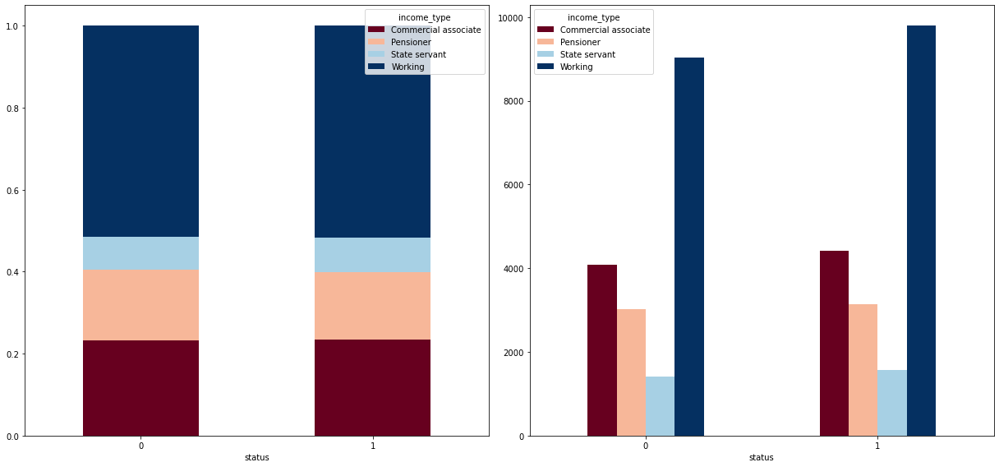

In [108]:
fig, axes = plt.subplots(1,2)

g1=pd.crosstab( df['status'] , df['income_type'],normalize='index').plot(kind = 'bar', stacked = True,colormap='RdBu', ax=axes[0])
g1.set_xticklabels(g1.get_xticklabels(), rotation=360)

g2=pd.crosstab( df['status'] , df['income_type']).plot(kind = 'bar',colormap='RdBu', ax=axes[1])
g2.set_xticklabels(g2.get_xticklabels(), rotation=360)

fig.set_size_inches(17,8)

plt.tight_layout()

plt.show()

**Relation between family_status and status variable**

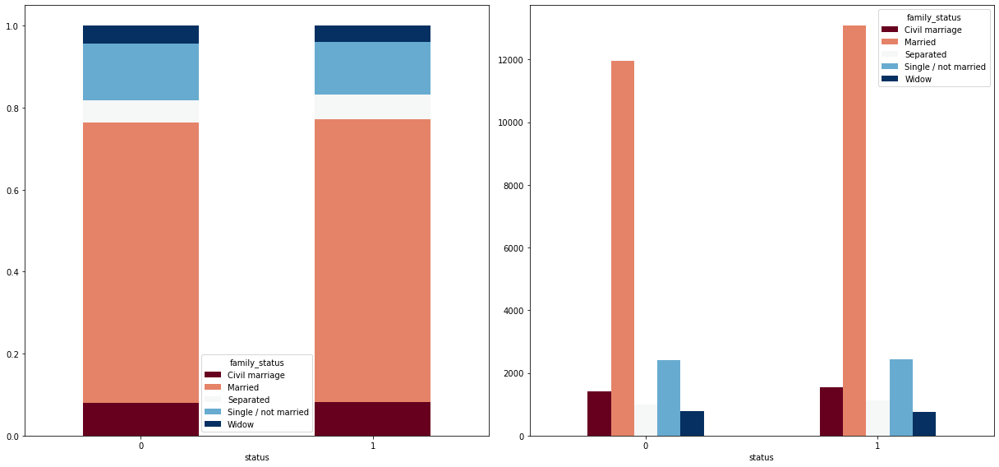

In [109]:
fig, axes = plt.subplots(1,2)

g1=pd.crosstab( df['status'] , df['family_status'],normalize='index').plot(kind = 'bar', stacked = True,colormap='RdBu', ax=axes[0])
g1.set_xticklabels(g1.get_xticklabels(), rotation=360)

g2=pd.crosstab( df['status'] , df['family_status']).plot(kind = 'bar',colormap='RdBu', ax=axes[1])
g2.set_xticklabels(g2.get_xticklabels(), rotation=360)

fig.set_size_inches(17,8)

plt.tight_layout()

plt.show()

**INFERENCE**

1)The applicants who are married are high in count compared to other categories so there may be significant relation between  family status and credit worthiness.

**Relation between count_fam_mem and status variable**

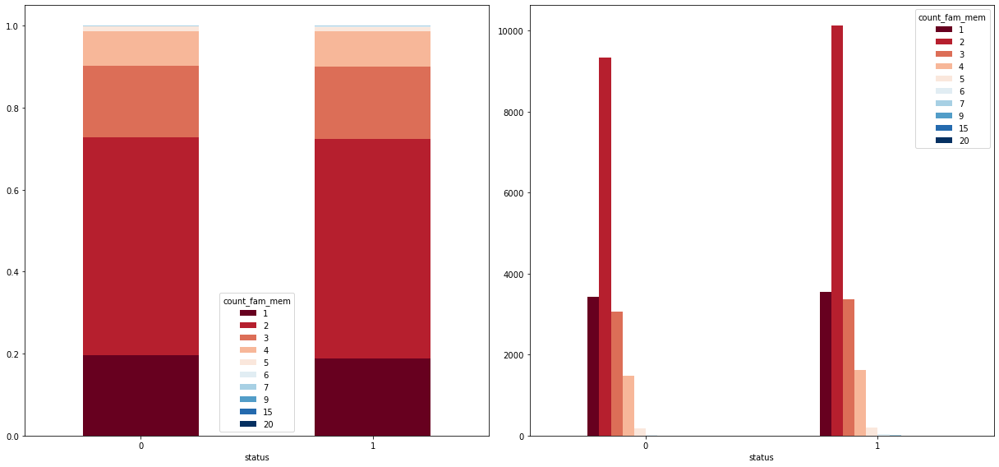

In [110]:
fig, axes = plt.subplots(1,2)

g1=pd.crosstab( df['status'] , df['count_fam_mem'],normalize='index').plot(kind = 'bar', stacked = True,colormap='RdBu', ax=axes[0])
g1.set_xticklabels(g1.get_xticklabels(), rotation=360)

g2=pd.crosstab( df['status'] , df['count_fam_mem']).plot(kind = 'bar',colormap='RdBu', ax=axes[1])
g2.set_xticklabels(g2.get_xticklabels(), rotation=360)

fig.set_size_inches(17,8)

plt.tight_layout()

plt.show()

**Inference:**
    1.The applicants with family members 2 are more in count compared to other family count so there may be significant relation between  family status and credit worthiness.

In [111]:
pd.crosstab( df['status'] , df['count_fam_mem'])

count_fam_mem,1,2,3,4,5,6,7,9,15,20
status,,,,,,,,,,
0,3434,9334,3061,1483,188,24,5,2,3,1
1,3552,10121,3358,1623,209,34,14,0,0,0


In [112]:
df['count_fam_mem'].value_counts()

2     19455
1      6986
3      6419
4      3106
5       397
6        58
7        19
15        3
9         2
20        1
Name: count_fam_mem, dtype: int64

In [113]:
df = df.replace(to_replace = [6,7,15,9,20] , value = 5)

In [114]:
df['count_fam_mem'].value_counts()

2    19455
1     6986
3     6419
4     3106
5      480
Name: count_fam_mem, dtype: int64

**Inference:**
   1.The applicants with family size ranging more than five are less in count so those are mapped with the family size 5.

**AFTER MAPPING**

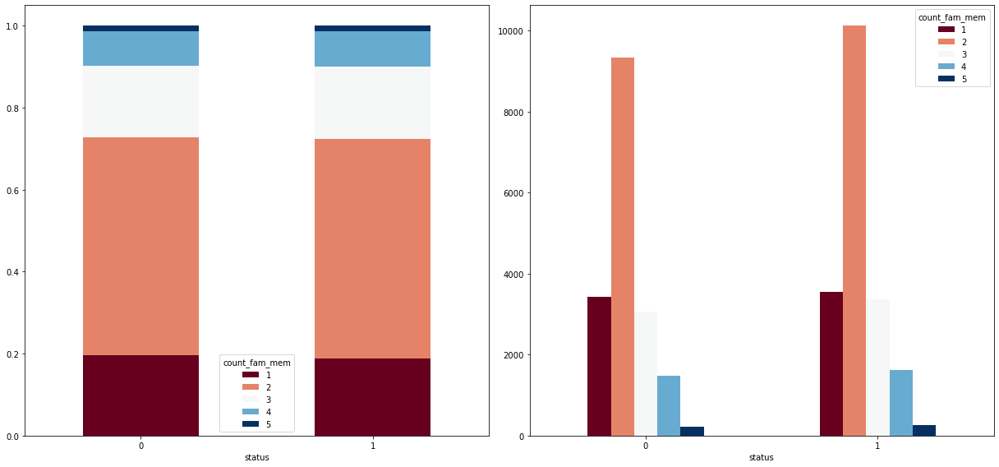

In [115]:
fig, axes = plt.subplots(1,2)

g1=pd.crosstab( df['status'] , df['count_fam_mem'],normalize='index').plot(kind = 'bar', stacked = True,colormap='RdBu', ax=axes[0])
g1.set_xticklabels(g1.get_xticklabels(), rotation=360)

g2=pd.crosstab( df['status'] , df['count_fam_mem']).plot(kind = 'bar',colormap='RdBu', ax=axes[1])
g2.set_xticklabels(g2.get_xticklabels(), rotation=360)

fig.set_size_inches(17,8)

plt.tight_layout()

plt.show()

In [116]:
df['count_fam_mem'] = df['count_fam_mem'].astype('object')

In [117]:
df.dtypes

id                    int64
gender               object
own_car              object
own_house            object
income              float64
income_type          object
education            object
family_status        object
housing_type         object
occupation_type      object
count_fam_mem        object
years_employed      float64
age                 float64
total_due_months      int64
status               object
dtype: object

**Relation between education and status variable**

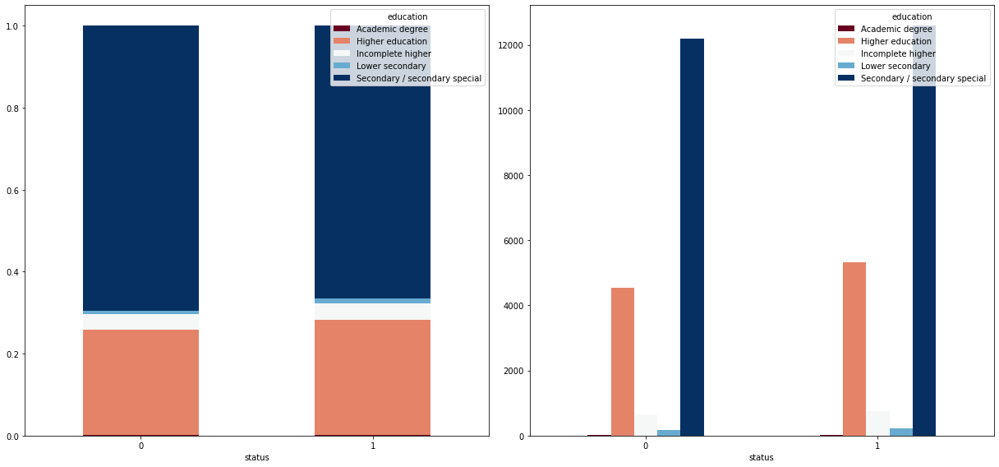

In [118]:
fig, axes = plt.subplots(1,2)

g1=pd.crosstab( df['status'] , df['education'],normalize='index').plot(kind = 'bar', stacked = True,colormap='RdBu', ax=axes[0])
g1.set_xticklabels(g1.get_xticklabels(), rotation=360)

g2=pd.crosstab( df['status'] , df['education']).plot(kind = 'bar', colormap='RdBu',ax=axes[1])
g2.set_xticklabels(g2.get_xticklabels(), rotation=360)

fig.set_size_inches(17,8)

plt.tight_layout()

plt.show()

**INFERENCE**

1)The applicants with education qualification as Higher and secondary education are having more credit worthiness comparing with other qualifications.

In [119]:
df['education'].value_counts()

Secondary / secondary special    24775
Higher education                  9855
Incomplete higher                 1410
Lower secondary                    374
Academic degree                     32
Name: education, dtype: int64

In [120]:
px.box(df, y = 'income', color = 'education')

In [121]:
print("Mean income for Higher education education type is:",round(df[df['education'] == 'Higher education']['income'].mean(),2) )
print("Mean income for Incomplete higher education type is:",round(df[df['education'] == 'Incomplete higher']['income'].mean(),2) )
print("Mean income for Lower secondary education type is:",round(df[df['education'] == 'Lower secondary']['income'].mean(),2) )
print("Mean income for Secondary / secondary special education type is:",round(df[df['education'] == 'Secondary / secondary special']['income'].mean(),2) )

Mean income for Higher education education type is: 196062.56
Mean income for Incomplete higher education type is: 186747.77
Mean income for Lower secondary education type is: 140546.79
Mean income for Secondary / secondary special education type is: 163793.39


In [122]:
df['education'].value_counts()

Secondary / secondary special    24775
Higher education                  9855
Incomplete higher                 1410
Lower secondary                    374
Academic degree                     32
Name: education, dtype: int64

In [123]:
df = df.replace(to_replace = ["Incomplete higher"] , value = "Higher education")

In [124]:
df['education']=df['education'].replace({'Secondary / secondary special':'Secondary education'}) #changing category name

In [125]:
df = df.replace(to_replace = ["Lower secondary"] , value = "Secondary education")

In [126]:
df['education'].value_counts()

Secondary education    25149
Higher education       11265
Academic degree           32
Name: education, dtype: int64

**Inference:** 
    
  On comparing mean values of Secondary / secondary special and lower secondary with income they are nearly in the similar range.so the Secondary / secondary special and lower secondary are mapped together as secondary education category type,similarly while comparing the mean values of Incomplete Higher and Higher education falls under the similar range so we mapped it together.

**Bar Plot between education and status after mapping**

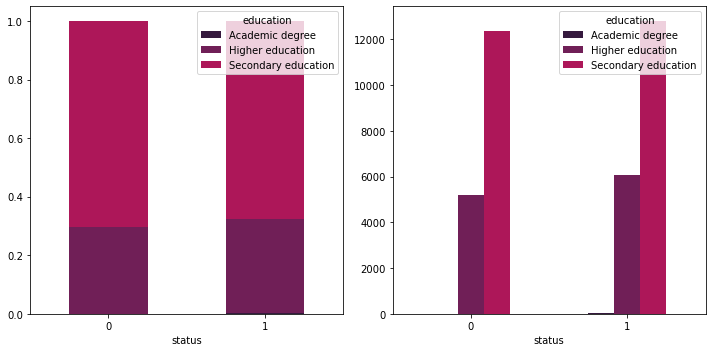

In [127]:
fig, axes = plt.subplots(1,2)

g1=pd.crosstab( df['status'] , df['education'],normalize='index').plot(kind = 'bar', stacked = True, ax=axes[0])
g1.set_xticklabels(g1.get_xticklabels(), rotation=360)

g2=pd.crosstab( df['status'] , df['education']).plot(kind = 'bar', ax=axes[1])
g2.set_xticklabels(g2.get_xticklabels(), rotation=360)

fig.set_size_inches(10,5)

plt.tight_layout()

plt.show()

**Relation between housing_type and status variable**

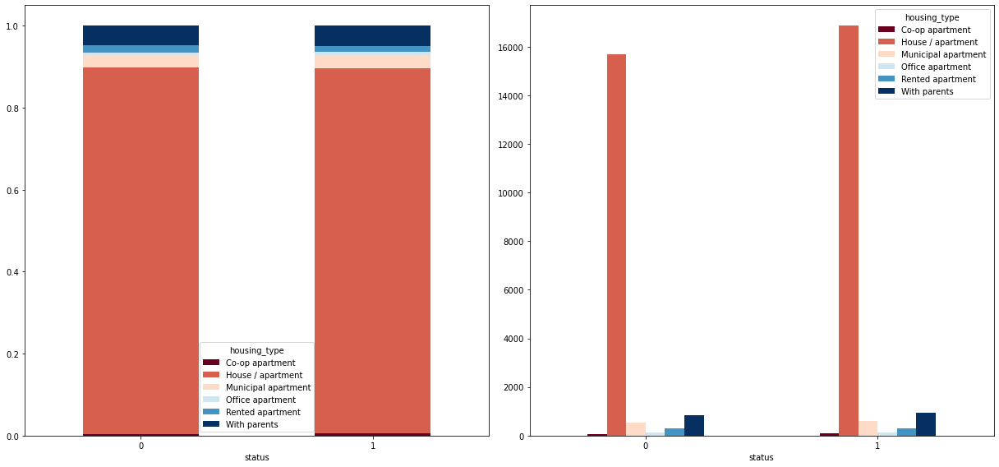

In [128]:
fig, axes = plt.subplots(1,2)

g1=pd.crosstab( df['status'] , df['housing_type'],normalize='index').plot(kind = 'bar', stacked = True,colormap='RdBu', ax=axes[0])
g1.set_xticklabels(g1.get_xticklabels(), rotation=360)

g2=pd.crosstab( df['status'] , df['housing_type']).plot(kind = 'bar',colormap='RdBu', ax=axes[1])
g2.set_xticklabels(g2.get_xticklabels(), rotation=360)

fig.set_size_inches(17,8)

plt.tight_layout()

plt.show()

**Checking the % contribution on target for each Category types**

In [129]:
df['housing_type'].value_counts()

House / apartment      32538
With parents            1775
Municipal apartment     1128
Rented apartment         575
Office apartment         262
Co-op apartment          168
Name: housing_type, dtype: int64

In [130]:
df['housing_type'].describe()

count                 36446
unique                    6
top       House / apartment
freq                  32538
Name: housing_type, dtype: object

In [131]:
px.box(df, y = 'income', color = 'housing_type')

In [132]:
df['housing_type'].value_counts()

House / apartment      32538
With parents            1775
Municipal apartment     1128
Rented apartment         575
Office apartment         262
Co-op apartment          168
Name: housing_type, dtype: int64

In [133]:
print("Mean income for  With parents housing_type is:",round(df[df['housing_type'] == 'With parents']['income'].mean(),2) )
print("Mean income for  With House / apartment housing_type is:",round(df[df['housing_type'] == 'House / apartment']['income'].mean(),2) )

Mean income for  With parents housing_type is: 168118.48
Mean income for  With House / apartment housing_type is: 173175.5


**Mapping with replacement**

In [134]:
df['housing_type']=df['housing_type'].replace({'With parents':'House / apartment'})

df['housing_type'] = df['housing_type'].replace({'House / apartment':'Own House'})

In [135]:
df['housing_type'].value_counts() 

Own House              34313
Municipal apartment     1128
Rented apartment         575
Office apartment         262
Co-op apartment          168
Name: housing_type, dtype: int64

**Inference:**-

    From the above observation the mean income of "housing_type" with "With parents" and "House / apartment" are in similar range.
    Also the median of both housing type "With parents" and "House / apartment" are equal while validating.so we have mapped it together as Own House Housing Type.

#### plot after mapping

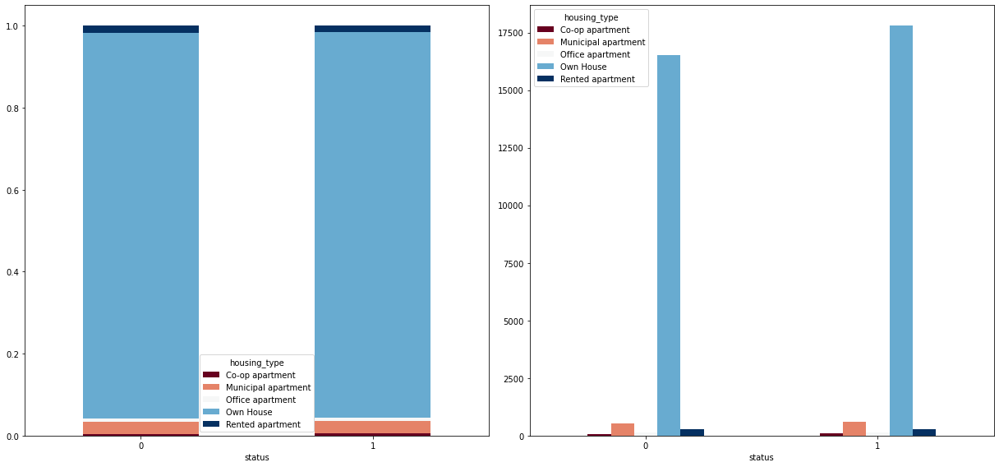

In [136]:
fig, axes = plt.subplots(1,2)

g1=pd.crosstab( df['status'] , df['housing_type'],normalize='index').plot(kind = 'bar', stacked = True,colormap='RdBu', ax=axes[0])
g1.set_xticklabels(g1.get_xticklabels(), rotation=360)

g2=pd.crosstab( df['status'] , df['housing_type']).plot(kind = 'bar',colormap='RdBu', ax=axes[1])
g2.set_xticklabels(g2.get_xticklabels(), rotation=360)

fig.set_size_inches(17,8)

plt.tight_layout()

plt.show()

**Relation between Occupation_type and status**

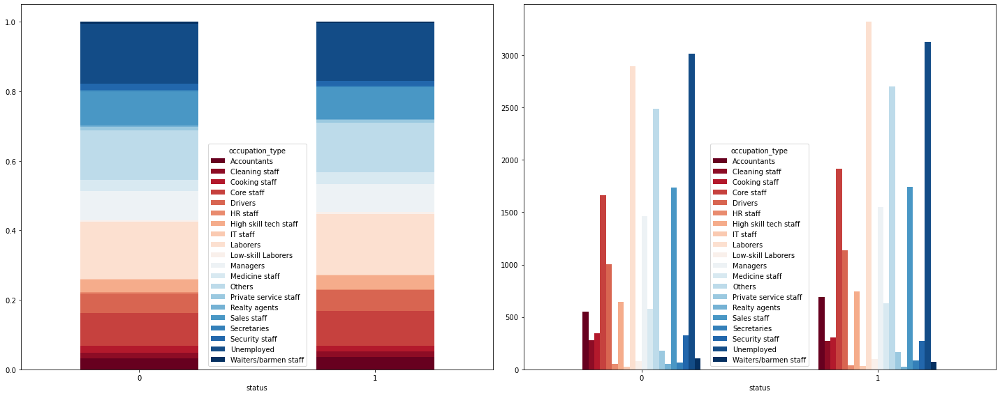

In [137]:
fig, axes = plt.subplots(1,2)

g1=pd.crosstab( df['status'] , df['occupation_type'],normalize='index').plot(kind = 'bar', stacked = True,colormap='RdBu', ax=axes[0])
g1.set_xticklabels(g1.get_xticklabels(), rotation=360)

g2=pd.crosstab( df['status'] , df['occupation_type']).plot(kind = 'bar',colormap='RdBu', ax=axes[1])
g2.set_xticklabels(g2.get_xticklabels(), rotation=360)

fig.set_size_inches(20,8)

plt.tight_layout()

plt.show()

**INFERENCE**

1)The applicants with occupation type Laborers,managers,others and unemployed are high in distribution of credit worthiness among other occupation types.

In [138]:
df['occupation_type'].value_counts() 

Laborers                 6209
Unemployed               6138
Others                   5187
Core staff               3583
Sales staff              3482
Managers                 3012
Drivers                  2138
High skill tech staff    1383
Accountants              1241
Medicine staff           1207
Cooking staff             655
Security staff            592
Cleaning staff            551
Private service staff     344
Low-skill Laborers        175
Waiters/barmen staff      174
Secretaries               151
HR staff                   85
Realty agents              79
IT staff                   60
Name: occupation_type, dtype: int64

In [139]:
px.box(df, y = 'income', color = 'occupation_type')

In [140]:
df['occupation_type'].value_counts()

Laborers                 6209
Unemployed               6138
Others                   5187
Core staff               3583
Sales staff              3482
Managers                 3012
Drivers                  2138
High skill tech staff    1383
Accountants              1241
Medicine staff           1207
Cooking staff             655
Security staff            592
Cleaning staff            551
Private service staff     344
Low-skill Laborers        175
Waiters/barmen staff      174
Secretaries               151
HR staff                   85
Realty agents              79
IT staff                   60
Name: occupation_type, dtype: int64

In [141]:
print("Mean income for Low-skill Laborers Occupation type",round(df[df['occupation_type'] == 'Low-skill Laborers']['income'].mean(),2) )

print("Mean income for Cooking staff Occupation type",round(df[df['occupation_type'] == 'Cooking staff']['income'].mean(),2) )

print("Mean income for Security staff Occupation type",round(df[df['occupation_type'] == 'Security staff']['income'].mean(),2) )

print("Mean income for Cleaning staff Occupation type",round(df[df['occupation_type'] == 'Cleaning staff']['income'].mean(),2) )

print("Mean income for Waiters/barmen staff Occupation type",round(df[df['occupation_type'] == 'Waiters/barmen staff']['income'].mean(),2))

print("Mean income for Private service staff Occupation type",round(df[df['occupation_type'] == 'Private service staff']['income'].mean(),2))

Mean income for Low-skill Laborers Occupation type 132865.71
Mean income for Cooking staff Occupation type 141951.98
Mean income for Security staff Occupation type 164822.38
Mean income for Cleaning staff Occupation type 146813.52
Mean income for Waiters/barmen staff Occupation type 153064.66
Mean income for Private service staff Occupation type 188058.14


In [142]:
print("Mean income for IT staff Occupation type",round(df[df['occupation_type'] == 'IT staff']['income'].mean(),2))

print("Mean income for High skill tech staff Occupation type",round(df[df['occupation_type'] == 'High skill tech staff']['income'].mean(),2))

Mean income for IT staff Occupation type 183172.5
Mean income for High skill tech staff Occupation type 184618.11


**Inference:** 
    On comparing the mean income of the occupation types ['Low-skill Laborers','Cooking staff','Security staff','Cleaning staff','Waiters/barmen staff','Private service staff']
    they are almost falls under similar range.so they are mapped with Low-skill Laborers.

**Mapping with replacement:** Waiters/barmen staff, Low-skill Laborers, Cleaning staff, Security staff
Cooking staff, Private service staff to Low-skill Laborers

In [143]:
df = df.replace(to_replace = ['Waiters/barmen staff','Cleaning staff','Security staff','Cooking staff','Private service staff'] , value = 'Low-skill Laborers')

**Mapping with replacement:** IT staff to High skill tech staff.

In [144]:
df['occupation_type']=df['occupation_type'].replace({'IT staff':'High skill tech staff'})

In [145]:
df['occupation_type'].value_counts() 

Laborers                 6209
Unemployed               6138
Others                   5187
Core staff               3583
Sales staff              3482
Managers                 3012
Low-skill Laborers       2491
Drivers                  2138
High skill tech staff    1443
Accountants              1241
Medicine staff           1207
Secretaries               151
HR staff                   85
Realty agents              79
Name: occupation_type, dtype: int64

**Plot after mapping**

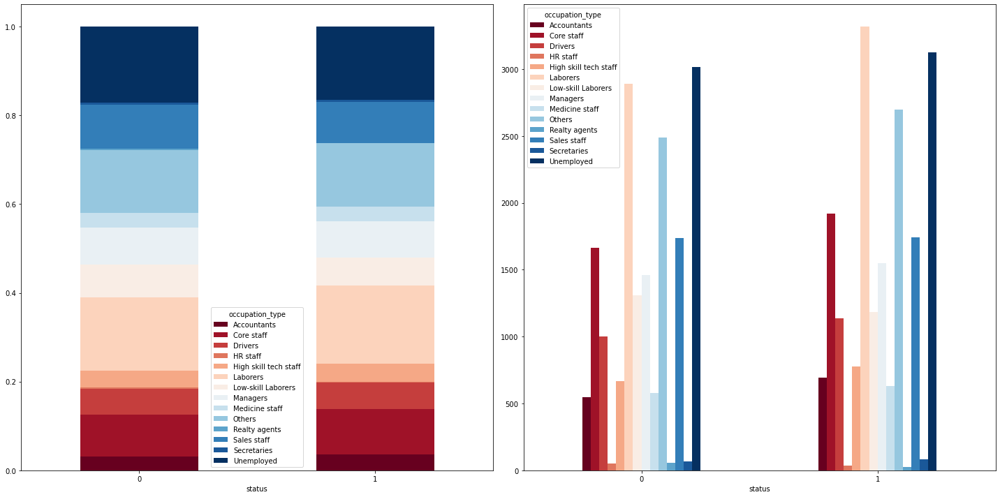

In [146]:
fig, axes = plt.subplots(1,2)

g1=pd.crosstab( df['status'] , df['occupation_type'],normalize='index').plot(kind = 'bar', stacked = True,colormap='RdBu', ax=axes[0])
g1.set_xticklabels(g1.get_xticklabels(), rotation=360)

g2=pd.crosstab( df['status'] , df['occupation_type']).plot(kind = 'bar',colormap='RdBu', ax=axes[1])
g2.set_xticklabels(g2.get_xticklabels(), rotation=360)

fig.set_size_inches(20,10)

plt.tight_layout()

plt.show()

**RELATION BETWEEN CONTINOUS AND TARGET VARIABLES**

In [147]:
df[['income','age','years_employed']].describe()

,income,age,years_employed
count,36446.000000,36446.000000,36446.000000
mean,173223.873800,43.767335,5.082342
std,65345.541105,11.508959,4.314418
min,27000.000000,20.500000,0.000000
25%,121500.000000,34.100000,1.100000
50%,157500.000000,42.600000,4.300000
75%,225000.000000,53.300000,8.500000
max,276750.000000,68.900000,12.350000


,income,age,years_employed,total_due_months
count,36446.000000,36446.000000,36446.000000,36446.000000
min,27000.000000,20.500000,0.000000,1.000000
max,276750.000000,68.900000,12.350000,61.000000
median,157500.000000,42.600000,4.300000,17.000000
mean,173223.873800,43.767335,5.082342,20.504747
skew,0.182443,0.184464,0.460523,0.712851


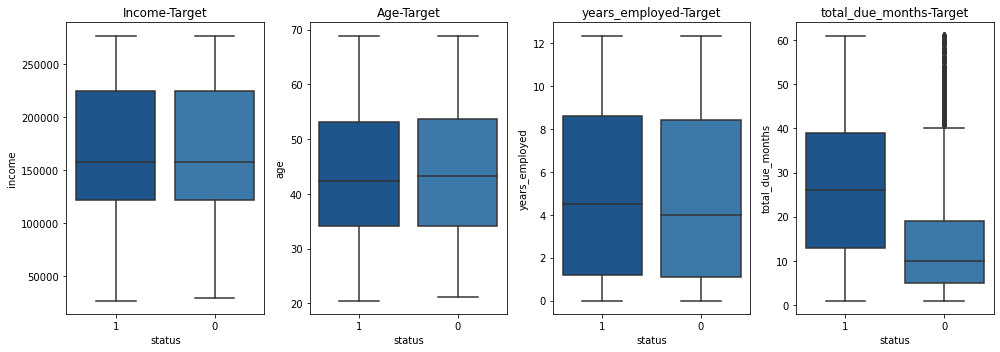

In [148]:
fig, axes = plt.subplots(1,4)

sns.set_palette("Blues_r")

g1=sns.boxplot(x='status', y='income', data=df, ax=axes[0])
g1.set_title("Income-Target")

g2=sns.boxplot(x='status', y='age', data=df, ax=axes[1])
g2.set_title("Age-Target")

g3=sns.boxplot(x='status', y='years_employed', data=df, ax=axes[2])
g3.set_title("years_employed-Target")

g4=sns.boxplot(x='status', y='total_due_months', data=df, ax=axes[3])
g4.set_title("total_due_months-Target")

fig.set_size_inches(14,5)

plt.tight_layout()

df[['income','age','years_employed', 'total_due_months']].agg(["count", "min", "max", "median", "mean", "skew" ])

**Inference:**
    
    The applicants with higher work experience are having more credit worthiness for approval.
    credit worthiness are equally distributed among age and income.

In [149]:
fig1 = px.box(df, x='status',y="income")
fig1.show()

fig2 = px.box(df, x='status',y="years_employed")
fig2.show()

fig3 = px.box(df, x='status',y="age")
fig3.show()

fig4 = px.box(df, x='status',y="total_due_months")
fig4.show()

In [150]:
df.head()

,id,gender,own_car,own_house,income,income_type,education,family_status,housing_type,occupation_type,count_fam_mem,years_employed,age,total_due_months,status
0,5008804,M,Y,Y,276750.0,Working,Higher education,Civil marriage,Rented apartment,Others,2,12.35,32.9,16,1
1,5008805,M,Y,Y,276750.0,Working,Higher education,Civil marriage,Rented apartment,Others,2,12.35,32.9,5,1
2,5008806,M,Y,Y,112500.0,Working,Secondary education,Married,Own House,Low-skill Laborers,2,3.10,58.8,30,1
3,5008808,F,N,Y,270000.0,Commercial associate,Secondary education,Single / not married,Own House,Sales staff,1,8.40,52.4,5,1
4,5008809,F,N,Y,270000.0,Commercial associate,Secondary education,Single / not married,Own House,Sales staff,1,8.40,52.4,5,1


In [151]:
df.dtypes

id                    int64
gender               object
own_car              object
own_house            object
income              float64
income_type          object
education            object
family_status        object
housing_type         object
occupation_type      object
count_fam_mem         int64
years_employed      float64
age                 float64
total_due_months      int64
status               object
dtype: object

In [152]:
df.isnull().sum()

id                  0
gender              0
own_car             0
own_house           0
income              0
income_type         0
education           0
family_status       0
housing_type        0
occupation_type     0
count_fam_mem       0
years_employed      0
age                 0
total_due_months    0
status              0
dtype: int64

In [153]:
df[df['status'] == '1']['income'].median()

157500.0

In [154]:
df[df['status'] == '0']['income'].median()

157500.0

In [155]:
df[df['status'] == '1']['age'].median()

42.3

In [156]:
df[df['status'] == '0']['age'].median()

43.2

In [157]:
df[df['status'] == '1']['years_employed'].median()

4.5

In [158]:
df[df['status'] == '0']['years_employed'].median()

4.0

### STATISTICAL TEST TO FIND SIGNIFICANCE RELATIONSHIP BETWEEN TARGET AND OTHER VARIABLES

**Analysis of Relation between categorical and Target variable**

NOTE:Converting Status data type to 'int64' for statistical analysis

In [159]:
df['status'] = df['status'].astype('int64')

**HYPOTHESIS TESTING**


##### Ho : Feature and Target are independant (No relation)
##### Ha : Feature and Target are dependant (There is a significant relation)

In [160]:
df['count_fam_mem'] = df['count_fam_mem'].astype('object')

In [161]:
num=df.select_dtypes(include=['int64','float64'])
num.columns

Index(['id', 'income', 'years_employed', 'age', 'total_due_months', 'status'], dtype='object')

**Chi-Square Test**

In [162]:
def chi_square_test(feature_column, target_column):
    
    obs_val = pd.crosstab(feature_column, target_column)
    test_stat,pval,dof,exp = stats.chi2_contingency(obs_val)
         
    if pval < 0.05:
        print("There is a \033[1m significant relationship \033[0m between (Reject H0) ",  '\033[1m'+ feature_column.name + '\033[0m', " and ",'\033[1m' + 'status' + '\033[0m',"\033[1mpvalue=\033[0m",pval)
        
    else:
        print("There is no significant between",feature_column.name, "and status","pvalue=",pval)

In [163]:
def chi_square_result(df):
    
    cont_categorical = df.dtypes[df.dtypes =='object'].index
    
    for column in df[cont_categorical].columns:
        
        chi_square_test(df[column], df['status'])

In [164]:
chi_square_result(df)

There is no significant between gender and status pvalue= 0.11098430030735769
There is no significant between own_car and status pvalue= 0.10209385764873544
There is a  significant relationship  between (Reject H0)  own_house  and  status pvalue= 0.0016495654447334907
There is no significant between income_type and status pvalue= 0.3450550145102346
There is a  significant relationship  between (Reject H0)  education  and  status pvalue= 5.6487488941586936e-08
There is a  significant relationship  between (Reject H0)  family_status  and  status pvalue= 0.02482386595747338
There is no significant between housing_type and status pvalue= 0.22746154111738823
There is a  significant relationship  between (Reject H0)  occupation_type  and  status pvalue= 9.275961988562151e-09
There is no significant between count_fam_mem and status pvalue= 0.3612385022435408


**Inference:**

     Among the above occupation_type, family_status, education, own_house variables are having significant relationship with the target variable 'status'

**Analysis of Relation between continuous and Target variable**

**Normality Test using shapiro wilk test**

In [165]:
print("Income", stats.shapiro(df['income']))
print("Age", stats.shapiro(df['age']))
print("years_employed", stats.shapiro(df['years_employed']))
print("total_due_months", stats.shapiro(df['total_due_months']))

Income ShapiroResult(statistic=0.9428659677505493, pvalue=0.0)
Age ShapiroResult(statistic=0.9662441611289978, pvalue=0.0)
years_employed ShapiroResult(statistic=0.8895602822303772, pvalue=0.0)
total_due_months ShapiroResult(statistic=0.9105543494224548, pvalue=0.0)


**Inference:** From the above shapiro test the pvalue of all the continous variables are less than the significant level(0.05)
    so the continous varible does not follow normal distribution


##### Ho : Feature and Target are independant (No relation)
##### Ha : Feature and Target are dependant (There is a significant relation)

In [166]:
def mannwhitneyu_test(feature_column, target_column):
    
    test_stat, pval = stats.mannwhitneyu(feature_column, target_column, alternative = 'two-sided')
        
    if pval < 0.05:    
        
        print("There is a \033[1m significant relationship(Reject H0) \033[0m between ", '\033[1m' + feature_column.name + '\033[0m', " and ",'\033[1m' + 'status' + '\033[0m',"\033[1m pvalue=\033[0m",pval)
       
    else:
        print("There is no significant between",feature_column.name, "and status")
        

In [167]:
def mannwhitneyu_result(df):
    
    cont_numerical = df.dtypes[(df.dtypes !='object') & (df.dtypes!='bool')].index
    
    for column in df[cont_numerical].columns:
        
        if column != 'status' and column != 'id':
            
            mannwhitneyu_test(df[column], df['status'])     

In [168]:
mannwhitneyu_result(df)

There is a  significant relationship(Reject H0)  between  income  and  status  pvalue= 0.0
There is a  significant relationship(Reject H0)  between  years_employed  and  status  pvalue= 0.0
There is a  significant relationship(Reject H0)  between  age  and  status  pvalue= 0.0
There is a  significant relationship(Reject H0)  between  total_due_months  and  status  pvalue= 0.0


In [169]:
df.columns

Index(['id', 'gender', 'own_car', 'own_house', 'income', 'income_type',
       'education', 'family_status', 'housing_type', 'occupation_type',
       'count_fam_mem', 'years_employed', 'age', 'total_due_months', 'status'],
      dtype='object')

In [170]:
df.select_dtypes(include='object').columns

Index(['gender', 'own_car', 'own_house', 'income_type', 'education',
       'family_status', 'housing_type', 'occupation_type', 'count_fam_mem'],
      dtype='object')

#### COPY OF PREPROCESSED DATA

In [171]:
df_model = df.copy() # df_model will be used for further modeling process

In [172]:
#df_model.to_csv('df_model_tot_mon.csv')

In [173]:
df.shape

(36446, 15)

In [174]:
df_model.shape

(36446, 15)

## MODELING

**LOGISTIC REGRESSION**

In [175]:
df_model.head()

,id,gender,own_car,own_house,income,income_type,education,family_status,housing_type,occupation_type,count_fam_mem,years_employed,age,total_due_months,status
0,5008804,M,Y,Y,276750.0,Working,Higher education,Civil marriage,Rented apartment,Others,2,12.35,32.9,16,1
1,5008805,M,Y,Y,276750.0,Working,Higher education,Civil marriage,Rented apartment,Others,2,12.35,32.9,5,1
2,5008806,M,Y,Y,112500.0,Working,Secondary education,Married,Own House,Low-skill Laborers,2,3.10,58.8,30,1
3,5008808,F,N,Y,270000.0,Commercial associate,Secondary education,Single / not married,Own House,Sales staff,1,8.40,52.4,5,1
4,5008809,F,N,Y,270000.0,Commercial associate,Secondary education,Single / not married,Own House,Sales staff,1,8.40,52.4,5,1


**ONE HOT ENCODING FOR CATEGORICAL VARIABLES**

In [176]:
df_model_cat=df_model.select_dtypes(include = "object")

In [177]:
df_model_cat.columns

Index(['gender', 'own_car', 'own_house', 'income_type', 'education',
       'family_status', 'housing_type', 'occupation_type', 'count_fam_mem'],
      dtype='object')

In [178]:
df_model_cat_encode = pd.get_dummies(data = df_model_cat, drop_first = True)
df_model_cat_encode.head()

,gender_M,own_car_Y,own_house_Y,income_type_Pensioner,income_type_State servant,income_type_Working,education_Higher education,education_Secondary education,family_status_Married,family_status_Separated,...,occupation_type_Medicine staff,occupation_type_Others,occupation_type_Realty agents,occupation_type_Sales staff,occupation_type_Secretaries,occupation_type_Unemployed,count_fam_mem_2,count_fam_mem_3,count_fam_mem_4,count_fam_mem_5
0,1,1,1,0,0,1,1,0,0,0,...,0,1,0,0,0,0,1,0,0,0
1,1,1,1,0,0,1,1,0,0,0,...,0,1,0,0,0,0,1,0,0,0
2,1,1,1,0,0,1,0,1,1,0,...,0,0,0,0,0,0,1,0,0,0
3,0,0,1,0,0,0,0,1,0,0,...,0,0,0,1,0,0,0,0,0,0
4,0,0,1,0,0,0,0,1,0,0,...,0,0,0,1,0,0,0,0,0,0


In [179]:
# store the target variable 'Chance of Admit' in a dataframe 'df_target'
y = df_model['status']

# store all the independent variables in a dataframe 'df_feature' 
# drop the column 'status' using drop()
# 'axis = 1' drops the specified column
X = df_model.drop(['id','status'], axis = 1)

In [180]:
#getting numerical

In [181]:
df_model_num= ['age' , 'income' , 'years_employed', 'total_due_months' ]

In [182]:
num_data = df_model[df_model_num]
num_data.head()

,age,income,years_employed,total_due_months
0,32.9,276750.0,12.35,16
1,32.9,276750.0,12.35,5
2,58.8,112500.0,3.10,30
3,52.4,270000.0,8.40,5
4,52.4,270000.0,8.40,5


In [183]:
df_fin_model = pd.concat([num_data,df_model_cat_encode] , axis = 1)

In [184]:
df_fin_model.head()

,age,income,years_employed,total_due_months,gender_M,own_car_Y,own_house_Y,income_type_Pensioner,income_type_State servant,income_type_Working,...,occupation_type_Medicine staff,occupation_type_Others,occupation_type_Realty agents,occupation_type_Sales staff,occupation_type_Secretaries,occupation_type_Unemployed,count_fam_mem_2,count_fam_mem_3,count_fam_mem_4,count_fam_mem_5
0,32.9,276750.0,12.35,16,1,1,1,0,0,1,...,0,1,0,0,0,0,1,0,0,0
1,32.9,276750.0,12.35,5,1,1,1,0,0,1,...,0,1,0,0,0,0,1,0,0,0
2,58.8,112500.0,3.10,30,1,1,1,0,0,1,...,0,0,0,0,0,0,1,0,0,0
3,52.4,270000.0,8.40,5,0,0,1,0,0,0,...,0,0,0,1,0,0,0,0,0,0
4,52.4,270000.0,8.40,5,0,0,1,0,0,0,...,0,0,0,1,0,0,0,0,0,0


In [185]:
df_fin_model.shape

(36446, 37)

In [186]:
#df_fin_model.to_csv('final_preprocessed_data.csv')

In [187]:
#train test

In [188]:
X = df_fin_model

In [189]:
X = df_fin_model

X = sm.add_constant(X)

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state = 10, test_size = 0.3)

# check the dimensions of the train & test subset using 'shape'
# print dimension of train set
print('X_train', X_train.shape)
print('y_train', y_train.shape)

# print dimension of test set
print('X_test', X_test.shape)
print('y_test', y_test.shape)

X_train (25512, 38)
y_train (25512,)
X_test (10934, 38)
y_test (10934,)


**scaling**

In [190]:
scaler = StandardScaler()

X_train[df_model_num] = scaler.fit_transform(X_train[df_model_num])

In [191]:
X_test[df_model_num] = scaler.fit_transform(X_test[df_model_num])

In [192]:
print('X_test', X_test.shape)
print('X_train', X_train.shape)

X_test (10934, 38)
X_train (25512, 38)


In [193]:
model = sm.Logit(y_train, X_train).fit(method='newton') #bfgs

model.summary()

Optimization terminated successfully.
         Current function value: 0.594806
         Iterations 5


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                 status   No. Observations:                25512
Model:                          Logit   Df Residuals:                    25474
Method:                           MLE   Df Model:                           37
Date:                Wed, 22 Feb 2023   Pseudo R-squ.:                  0.1409
Time:                        15:21:04   Log-Likelihood:                -15175.
converged:                       True   LL-Null:                       -17664.
Covariance Type:            nonrobust   LLR p-value:                     0.000
=========================================================================================================
                                            coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------------------
const                                     1.4928      0.553      2.702      0.007       0.410       2.576
age                                      -0.0959      0.020     -4.739      0.000      -0.136      -0.056
income                                   -0.0426      0.015     -2.758      0.006      -0.073      -0.012
years_employed                           -0.0123      0.018     -0.696      0.486      -0.047       0.022
total_due_months                          1.0127      0.016     61.538      0.000       0.980       1.045
gender_M                                  0.0237      0.036      0.656      0.512      -0.047       0.095
own_car_Y                                -0.0136      0.032     -0.427      0.669      -0.076       0.049
own_house_Y                               0.0244      0.030      0.806      0.420      -0.035       0.084
income_type_Pensioner                    -0.8875      0.645     -1.376      0.169      -2.152       0.377
income_type_State servant                -0.0192      0.059     -0.323      0.746      -0.136       0.097
income_type_Working                       0.0227      0.035      0.643      0.521      -0.047       0.092
education_Higher education               -0.6707      0.495     -1.355      0.175      -1.641       0.300
education_Secondary education            -0.8077      0.495     -1.632      0.103      -1.778       0.162
family_status_Married                    -0.0704      0.052     -1.361      0.173      -0.172       0.031
family_status_Separated                   0.0103      0.094      0.109      0.913      -0.174       0.194
family_status_Single / not married       -0.0141      0.091     -0.155      0.877      -0.192       0.164
family_status_Widow                      -0.0276      0.111     -0.250      0.803      -0.244       0.189
housing_type_Municipal apartment         -0.3847      0.220     -1.750      0.080      -0.816       0.046
housing_type_Office apartment            -0.3229      0.264     -1.224      0.221      -0.840       0.194
housing_type_Own House                   -0.3715      0.205     -1.811      0.070      -0.773       0.031
housing_type_Rented apartment            -0.3236      0.232     -1.397      0.162      -0.778       0.130
occupation_type_Core staff               -0.1750      0.089     -1.974      0.048      -0.349      -0.001
occupation_type_Drivers                  -0.1665      0.102     -1.639      0.101      -0.366       0.033
occupation_type_HR staff                 -0.9073      0.316     -2.872      0.004      -1.526      -0.288
occupation_type_High skill tech staff    -0.2942      0.104     -2.832      0.005      -0.498      -0.091
occupation_type_Laborers                 -0.1195      0.087     -1.379      0.168      -0.289       0.050
occupation_type_Low-skill Laborers       -0.3500      0.095     -3.678      0.000      -0.536      -0.163
occupation_type_Managers                 -0.3028      0.091  

**prediction**

In [194]:
y_pred_prob = model.predict(X_test)

# print the y_pred_prob
y_pred_prob.head()

28799     0.283271
47579     0.675549
45743     0.418263
434592    0.402307
27300     0.467039
dtype: float64

In [195]:
# convert probabilities to 0 and 1 using 'if_else'
y_pred = [ 0 if x < 0.5 else 1 for x in y_pred_prob]

In [196]:
y_pred[0:5]

[0, 1, 0, 0, 0]

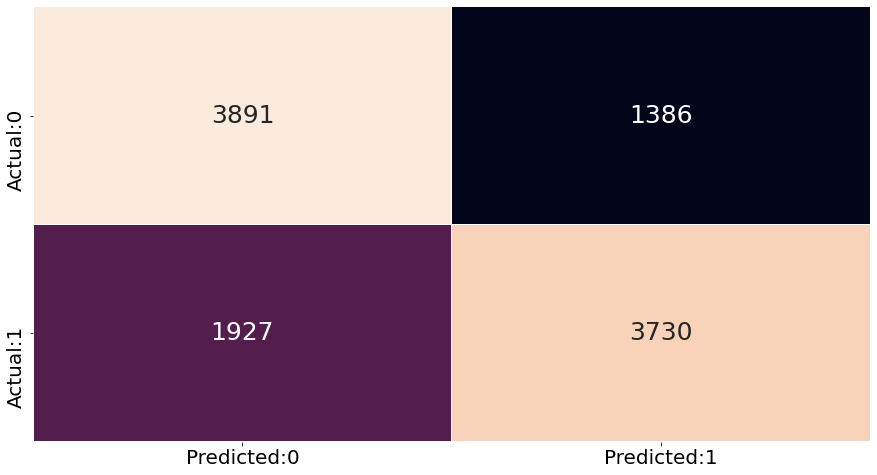

In [197]:
# create a confusion matrix
# pass the actual and predicted target values to the confusion_matrix()
cm = confusion_matrix(y_test, y_pred)

conf_matrix = pd.DataFrame(data = cm,columns = ['Predicted:0','Predicted:1'], index = ['Actual:0','Actual:1'])
 
sns.heatmap(conf_matrix, annot = True, fmt = 'd', cbar = False, 
            linewidths = 0.1, annot_kws = {'size':25})

plt.xticks(fontsize = 20)

plt.yticks(fontsize = 20)

plt.show()

In [198]:
cm #for test

array([[3891, 1386],
       [1927, 3730]], dtype=int64)

In [199]:
# True Negatives are denoted by 'TN'
# Actual 'O' values which are classified correctly
TN = cm[0,0]

# True Positives are denoted by 'TP'
# Actual '1' values which are classified correctly
TP = cm[1,1]

# False Positives are denoted by 'FP'
# it is the type 1 error
# Actual 'O' values which are classified wrongly as '1'
FP = cm[0,1]

# False Negatives are denoted by 'FN'
# it is the type 2 error
# Actual '1' values which are classified wrongly as '0'
FN = cm[1,0]

**PRECISION**

In [200]:
# calculate the precision value
precision = TP / (TP+FP)

# print the value
precision

0.7290852228303362

**inference:** the ratio of true positives to the total positive predictions is 0.5311122862682884 

**Recall:** It is the ratio of true positives to the total actual positive observations. It is also known as, `Sensitivity` or `True Positive Rate`.

In [201]:
# calculate the recall value
recall = TP / (TP+FN)

# print the value
recall

0.6593600848506276

**Inference:** The ratio of true positives to total actual positive observations is 0.794148655772272

**Specificity:** 

In [202]:
# calculate the specificity value
specificity = TN / (TN+FP)

# print the value
specificity

0.7373507674815236

**Inference:**The ratio of true negatives to the total actual negative observations is 0.2391304347826087

**f1-score:** 

In [203]:
# calculate the f1_score
f1_score = 2*((precision*recall)/(precision+recall))

# print the f1_score
f1_score

0.692471920542096

**Inference:** the F1 score is obtained as 0.692471920542096

**Accuracy:** 

In [204]:
# calculate the accuracy
accuracy = (TN+TP) / (TN+FP+FN+TP)

# print the accuracy
accuracy

0.6970001829156759

**Interpretation:** For our dataset, both the values for accuracy and f1-score are not equal. We can say that our model is 52% accurate.

**classification_report for test**

In [205]:
# calculate various performance measures
acc_table = classification_report(y_test, y_pred)

# print the table
print(acc_table)

              precision    recall  f1-score   support

           0       0.67      0.74      0.70      5277
           1       0.73      0.66      0.69      5657

    accuracy                           0.70     10934
   macro avg       0.70      0.70      0.70     10934
weighted avg       0.70      0.70      0.70     10934



**classification_report for train**

In [206]:
y_pred_prob_train = model.predict(X_train)

# print the y_pred_prob
y_pred_prob_train.head()

393      0.769644
42691    0.803696
14330    0.258920
31919    0.696778
11099    0.362861
dtype: float64

In [207]:
y_pred_train = [0 if i<0.5 else 1 for i in y_pred_prob_train ]

In [208]:
print(classification_report(y_train, y_pred_train))

              precision    recall  f1-score   support

           0       0.67      0.73      0.70     12258
           1       0.73      0.66      0.69     13254

    accuracy                           0.70     25512
   macro avg       0.70      0.70      0.70     25512
weighted avg       0.70      0.70      0.70     25512



In [209]:
cm = confusion_matrix(y_train, y_pred_train)
cm

array([[8984, 3274],
       [4493, 8761]], dtype=int64)

In [210]:
cm = confusion_matrix(y_train, y_pred_train)
cm

array([[8984, 3274],
       [4493, 8761]], dtype=int64)

**ROC and AUC Score for test and train**

In [211]:
from sklearn.metrics import roc_auc_score

In [212]:
print("Test Score",round(roc_auc_score(y_test, y_pred_prob),4))
print("Train Score", round(roc_auc_score(y_train, y_pred_train),4))

Test Score 0.7419
Train Score 0.697


**Kappa score:**

In [213]:
# compute the kappa value
kappa = cohen_kappa_score(y_test, y_pred)

# print the kappa value
print('kappa value:',kappa)

kappa value: 0.39534953671332385


#### Plot the ROC curve.

ROC curve is plotted with the true positive rate (tpr) on the y-axis and false positive rate (fpr) on the x-axis. The area under this curve is used as a measure of separability of the model.

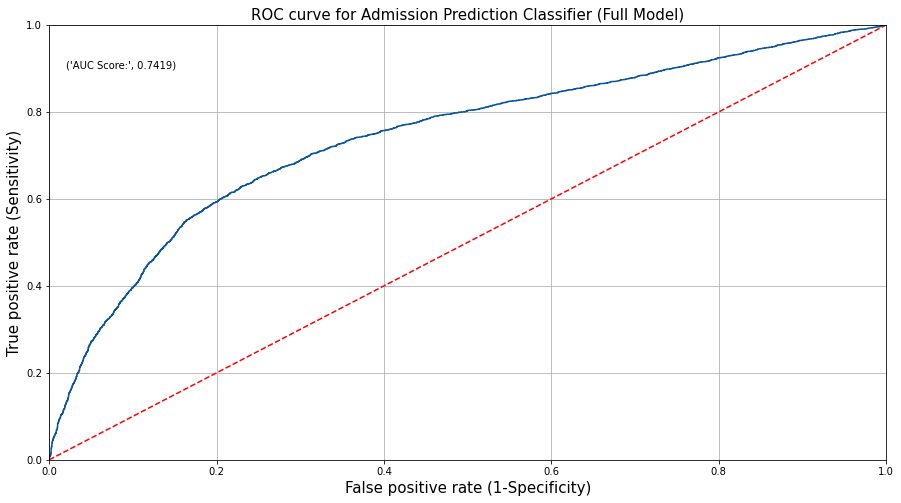

In [214]:
fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)

plt.plot(fpr, tpr)

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])

plt.plot([0, 1], [0, 1],'r--')

plt.title('ROC curve for Admission Prediction Classifier (Full Model)', fontsize = 15)
plt.xlabel('False positive rate (1-Specificity)', fontsize = 15)
plt.ylabel('True positive rate (Sensitivity)', fontsize = 15)

plt.text(x = 0.02, y = 0.9, s = ('AUC Score:', round(metrics.roc_auc_score(y_test, y_pred_prob),4)))
                               
plt.grid(True)

**Inference from the model:** 
    The base model shows the class imbalance and poor performance for the class (accuracy of predicting bad credit worthiness(status-0))
In future model improvement we need to reduce the class imbalance as well increase in accuracy with recall and precision.

**Probability Cut Off**

In [215]:
score_card = pd.DataFrame(columns=['Probability Cutoff', 'AUC Score', 'Precision Score', 'Recall Score',
                                       'Accuracy Score', 'Kappa Score', 'f1-score'])

# append the result table for all performance scores
# performance measures considered for model comparision are 'AUC Score', 'Precision Score', 'Recall Score','Accuracy Score',
# 'Kappa Score', and 'f1-score'
# compile the required information in a user defined function 
def update_score_card(model, cutoff):
    
    # let 'y_pred_prob' be the predicted values of y
    y_pred_prob = model.predict(X_test)

    # convert probabilities to 0 and 1 using 'if_else'
    y_pred = [ 0 if x < cutoff else 1 for x in y_pred_prob]
    
    # assign 'score_card' as global variable
    global score_card

    # append the results to the dataframe 'score_card'
    # 'ignore_index = True' do not consider the index labels
    score_card = score_card.append({'Probability Cutoff': cutoff,
                                    'AUC Score' : metrics.roc_auc_score(y_test, y_pred),
                                    'Precision Score': metrics.precision_score(y_test, y_pred),
                                    'Recall Score': metrics.recall_score(y_test, y_pred),
                                    'Accuracy Score': metrics.accuracy_score(y_test, y_pred),
                                    'Kappa Score':metrics.cohen_kappa_score(y_test, y_pred),
                                    'f1-score': metrics.f1_score(y_test, y_pred)}, 
                                    ignore_index = True)

In [216]:
cutoff = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]

for value in cutoff:
    update_score_card(model, value)

In [217]:
print('Score Card for Logistic regression:')


score_card = score_card.sort_values('Probability Cutoff').reset_index(drop = True)


score_card.style.highlight_max(color = 'lightblue', subset = ['AUC Score', 'Accuracy Score', 'Kappa Score', 'f1-score'])

Score Card for Logistic regression:


,Probability Cutoff,AUC Score,Precision Score,Recall Score,Accuracy Score,Kappa Score,f1-score
0,0.100000,0.500000,0.517377,1.000000,0.517377,0.000000,0.681936
1,0.200000,0.501643,0.518199,0.999116,0.518932,0.003399,0.682444
2,0.300000,0.583417,0.568769,0.891108,0.594110,0.170308,0.694353
3,0.400000,0.669211,0.655735,0.774085,0.672855,0.340635,0.710012
4,0.500000,0.698355,0.729085,0.659360,0.697000,0.395350,0.692472
5,0.600000,0.692480,0.784065,0.546226,0.687397,0.380801,0.643884
6,0.700000,0.646398,0.812246,0.389252,0.637461,0.287407,0.526291
7,0.800000,0.598697,0.856963,0.240410,0.586245,0.192409,0.375483
8,0.900000,0.531147,0.890351,0.071769,0.515182,0.060298,0.132832


In [218]:
youdens_table = pd.DataFrame({'TPR': tpr,
                             'FPR': fpr,
                             'Threshold': thresholds})


youdens_table['Difference'] = youdens_table.TPR - youdens_table.FPR


youdens_table = youdens_table.sort_values('Difference', ascending = False).reset_index(drop = True)

# print the first five observations
youdens_table.head()

,TPR,FPR,Threshold,Difference
0,0.644688,0.245784,0.514821,0.398904
1,0.644865,0.245973,0.514682,0.398892
2,0.648047,0.249195,0.511416,0.398852
3,0.629662,0.230813,0.528976,0.398849
4,0.648223,0.249384,0.511280,0.398839


# RFE

In [219]:
X_train_rfe = X_train.iloc[:,1:]
X_test_rfe = X_test.iloc[:,1:]

# initiate logistic regression model to use in feature selection
logreg = LogisticRegression()

# build the RFE model
# pass the logistic regression model to 'estimator'
# pass number of required features to 'n_features_to_select'
# if we do not pass the number of features, RFE considers half of the features
rfe_model = RFE(estimator = logreg, n_features_to_select = 10)

# fit the RFE model on the train dataset using fit()
rfe_model = rfe_model.fit(X_train_rfe, y_train)

# create a series containing feature and its corresponding rank obtained from RFE
# 'ranking_' returns the rank of each variable after applying RFE
# pass the ranks as the 'data' of a series
# 'index' assigns feature names as index of a series 
feat_index = pd.Series(data = rfe_model.ranking_, index = X_train_rfe.columns)

# select the features with rank = 1
# 'index' returns the indices of a series (i.e. features with rank=1) 
signi_feat_rfe = feat_index[feat_index==1].index

# print the significant features obtained from RFE
print(signi_feat_rfe)

Index(['total_due_months', 'income_type_Pensioner',
       'education_Higher education', 'education_Secondary education',
       'housing_type_Municipal apartment', 'housing_type_Office apartment',
       'housing_type_Own House', 'occupation_type_HR staff',
       'occupation_type_Realty agents', 'occupation_type_Unemployed'],
      dtype='object')


In [220]:
X_train.head()

,const,age,income,years_employed,total_due_months,gender_M,own_car_Y,own_house_Y,income_type_Pensioner,income_type_State servant,...,occupation_type_Medicine staff,occupation_type_Others,occupation_type_Realty agents,occupation_type_Sales staff,occupation_type_Secretaries,occupation_type_Unemployed,count_fam_mem_2,count_fam_mem_3,count_fam_mem_4,count_fam_mem_5
393,1.0,0.736532,-1.518204,1.677466,0.925986,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
42691,1.0,-0.670614,-0.518242,0.717963,1.182895,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
14330,1.0,1.692001,-1.276834,-1.177921,-1.129287,0,1,1,1,0,...,0,0,0,0,0,1,1,0,0,0
31919,1.0,1.961270,-0.587205,-1.177921,0.733304,0,0,1,1,0,...,0,0,0,0,0,1,0,0,0,0
11099,1.0,0.128506,-1.345797,-0.623028,-0.551241,0,0,1,0,0,...,0,0,0,0,0,0,0,1,0,0


In [221]:
X_train = X_train.drop('const', axis = 1)

In [222]:
X_train.head()

,age,income,years_employed,total_due_months,gender_M,own_car_Y,own_house_Y,income_type_Pensioner,income_type_State servant,income_type_Working,...,occupation_type_Medicine staff,occupation_type_Others,occupation_type_Realty agents,occupation_type_Sales staff,occupation_type_Secretaries,occupation_type_Unemployed,count_fam_mem_2,count_fam_mem_3,count_fam_mem_4,count_fam_mem_5
393,0.736532,-1.518204,1.677466,0.925986,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
42691,-0.670614,-0.518242,0.717963,1.182895,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,1,0
14330,1.692001,-1.276834,-1.177921,-1.129287,0,1,1,1,0,0,...,0,0,0,0,0,1,1,0,0,0
31919,1.961270,-0.587205,-1.177921,0.733304,0,0,1,1,0,0,...,0,0,0,0,0,1,0,0,0,0
11099,0.128506,-1.345797,-0.623028,-0.551241,0,0,1,0,0,1,...,0,0,0,0,0,0,0,1,0,0


In [223]:
X_test.head()

,const,age,income,years_employed,total_due_months,gender_M,own_car_Y,own_house_Y,income_type_Pensioner,income_type_State servant,...,occupation_type_Medicine staff,occupation_type_Others,occupation_type_Realty agents,occupation_type_Sales staff,occupation_type_Secretaries,occupation_type_Unemployed,count_fam_mem_2,count_fam_mem_3,count_fam_mem_4,count_fam_mem_5
28799,1.0,1.422480,0.793067,-1.178275,-0.997990,0,1,1,1,0,...,0,0,0,0,0,1,0,0,0,0
47579,1.0,1.144191,1.479475,-1.108327,0.565141,1,1,1,0,0,...,0,0,0,0,0,0,0,1,0,0
45743,1.0,0.361502,-0.579749,1.316528,-0.411816,1,1,0,0,0,...,0,0,0,0,0,0,1,0,0,0
434592,1.0,0.883295,0.106659,-1.178275,-0.672338,1,0,1,1,0,...,0,0,0,0,0,1,1,0,0,0
27300,1.0,0.796329,-0.373827,-1.178275,-0.281555,0,0,1,1,0,...,0,0,0,0,0,1,1,0,0,0


In [224]:
#dropping for the test
X_test = X_test.drop('const', axis = 1)

In [225]:
from sklearn.metrics import classification_report
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn import tree
from sklearn.model_selection import GridSearchCV

In [226]:
from scipy.stats import randint as sp_randint
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV

# Model Comparision

### Tuned XG Boost

In [227]:
from sklearn.model_selection import RandomizedSearchCV
import xgboost as xgb
xgbc = xgb.XGBClassifier()
from scipy.stats import randint as sp_randint
from scipy.stats import uniform as sp_uniform
from sklearn.metrics import confusion_matrix, accuracy_score, roc_auc_score, roc_curve, classification_report

params={ 'max_depth':sp_randint(2,15),'learning_rate':sp_uniform(0,1),'min_child_weight':sp_randint(2,30)}
rsearch=RandomizedSearchCV(estimator= xgbc, param_distributions=params,cv=3,scoring='roc_auc',n_jobs=-1,random_state=1,n_iter=30)
rsearch.fit(X_train, y_train)
xgbc = xgb.XGBClassifier(**rsearch.best_params_)
xgbc.fit(X_train,y_train)
y_train_pred=xgbc.predict(X_train)
y_train_prob=xgbc.predict_proba(X_train)[:,1]

print('Accuracy score of train: ', accuracy_score(y_train,y_train_pred))
print('Confusion Matrix of train: ', confusion_matrix(y_train,y_train_pred))
print('Auc of train: ', roc_auc_score(y_train,y_train_prob))
print(classification_report(y_train,y_train_pred))

y_test_pred=xgbc.predict(X_test)
y_test_prob=xgbc.predict_proba(X_test)[:,1]
print('Accuracy score of test: ', accuracy_score(y_test,y_test_pred))
print('Confusion Matrix of test: ', confusion_matrix(y_test,y_test_pred))
print('Auc of test: ', roc_auc_score(y_test,y_test_prob))
print(classification_report(y_test,y_test_pred))

[15:25:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[15:25:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Accuracy score of train:  0.8713154593916588
Confusion Matrix of train:  [[10647  1611]
 [ 1672 11582]]
Auc of train:  0.9499003960988341
              precision    recall  f1-score   support

           0       0.86      0.87      0.87     12258
           1       0.88      0.87      0.88     13254

    accuracy                           0.87     25512
   macro avg       0.87 

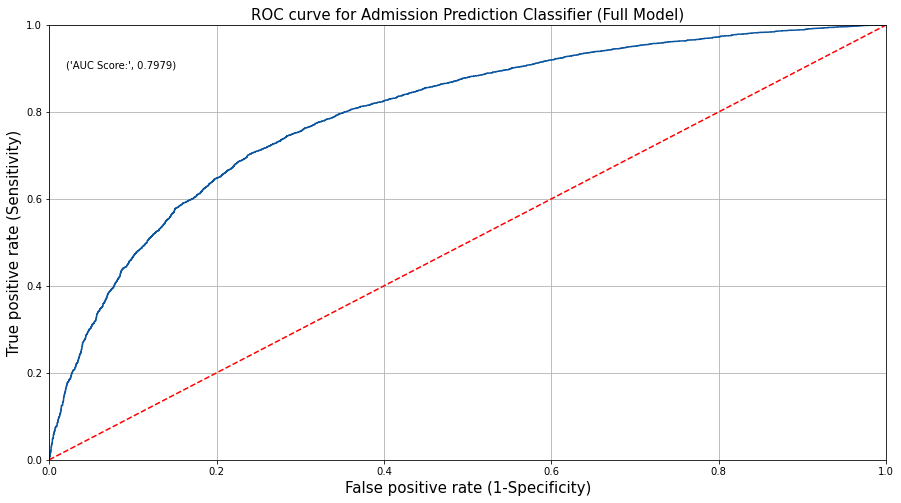

In [228]:
fpr, tpr, thresholds = roc_curve(y_test, y_test_prob)

plt.plot(fpr, tpr)

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])

plt.plot([0, 1], [0, 1],'r--')

plt.title('ROC curve for Admission Prediction Classifier (Full Model)', fontsize = 15)
plt.xlabel('False positive rate (1-Specificity)', fontsize = 15)
plt.ylabel('True positive rate (Sensitivity)', fontsize = 15)

plt.text(x = 0.02, y = 0.9, s = ('AUC Score:', round(metrics.roc_auc_score(y_test, y_test_prob),4)))
                               
plt.grid(True)

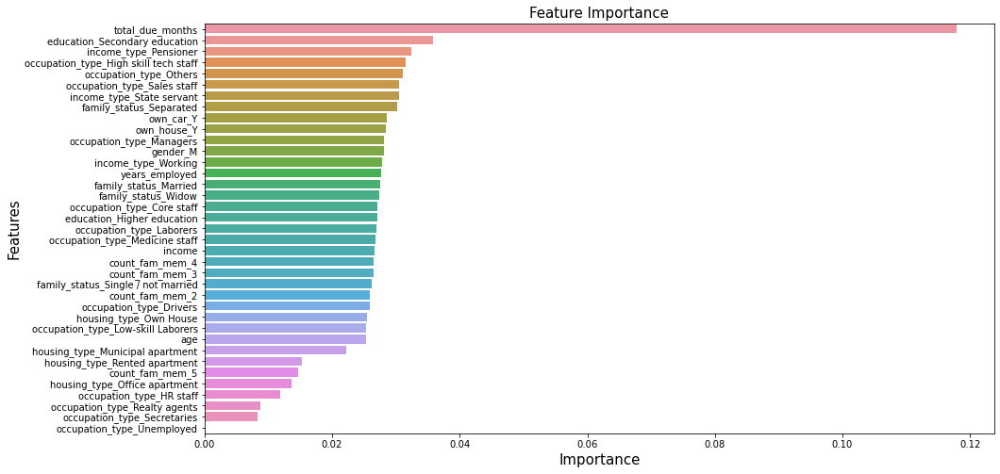

In [229]:
plt.rcParams['figure.figsize'] = [15,8]

important_features = pd.DataFrame({'Features': X_train.columns, 
                                   'Importance': xgbc.feature_importances_})

# sort the dataframe in the descending order according to the feature importance
important_features = important_features.sort_values('Importance', ascending = False)

# create a barplot to visualize the features based on their importance
sns.barplot(x = 'Importance', y = 'Features', data = important_features)

# add plot and axes labels
# set text size using 'fontsize'
plt.title('Feature Importance', fontsize = 15)
plt.xlabel('Importance', fontsize = 15)
plt.ylabel('Features', fontsize = 15)

# display the plot
plt.show()

### Random Forest with Randomized Search CV

In [230]:
n_estimators = [int(x) for x in np.linspace(start = 10, stop = 200, num = 2)]
max_features = ['auto', 'sqrt']
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
min_samples_split = [2, 5, 10]
min_samples_leaf = [1, 2, 4]
bootstrap = [True, False]

grid_rf = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}

rf = RandomForestClassifier()
grid = RandomizedSearchCV(rf, grid_rf, cv = 5,verbose = True, n_jobs = -1)
grid.fit(X_train,y_train)
params = grid.best_params_
print(params)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
{'n_estimators': 200, 'min_samples_split': 10, 'min_samples_leaf': 2, 'max_features': 'sqrt', 'max_depth': 110, 'bootstrap': False}


In [231]:
rf_grid = RandomForestClassifier(n_estimators = 200, min_samples_split = 10, min_samples_leaf = 2, max_features = 'sqrt', max_depth = 30, bootstrap = False, random_state = 10) 
rf_grid = rf.fit(X_train, y_train) 
from sklearn.metrics import confusion_matrix, accuracy_score, roc_auc_score, roc_curve, classification_report
from sklearn.metrics import confusion_matrix
y_train_pred=rf_grid.predict(X_train)
y_train_prob=rf_grid.predict_proba(X_train)[:,1]
print('Accuracy score of train: ', accuracy_score(y_train,y_train_pred))
print('Confusion Matrix of train: ', confusion_matrix(y_train,y_train_pred))
print('Auc of train: ', roc_auc_score(y_train,y_train_prob))
print(classification_report(y_train,y_train_pred))

y_test_pred=rf_grid.predict(X_test)
y_test_prob=rf_grid.predict_proba(X_test)[:,1]
print('Accuracy score of test: ', accuracy_score(y_test,y_test_pred))
print('Confusion Matrix of test: ', confusion_matrix(y_test,y_test_pred))
print('Auc of test: ', roc_auc_score(y_test,y_test_prob))
print(classification_report(y_test,y_test_pred))

Accuracy score of train:  0.9625666353088742
Confusion Matrix of train:  [[11811   447]
 [  508 12746]]
Auc of train:  0.9958421107794018
              precision    recall  f1-score   support

           0       0.96      0.96      0.96     12258
           1       0.97      0.96      0.96     13254

    accuracy                           0.96     25512
   macro avg       0.96      0.96      0.96     25512
weighted avg       0.96      0.96      0.96     25512

Accuracy score of test:  0.7448326321565758
Confusion Matrix of test:  [[3860 1417]
 [1373 4284]]
Auc of test:  0.8175024283976522
              precision    recall  f1-score   support

           0       0.74      0.73      0.73      5277
           1       0.75      0.76      0.75      5657

    accuracy                           0.74     10934
   macro avg       0.74      0.74      0.74     10934
weighted avg       0.74      0.74      0.74     10934



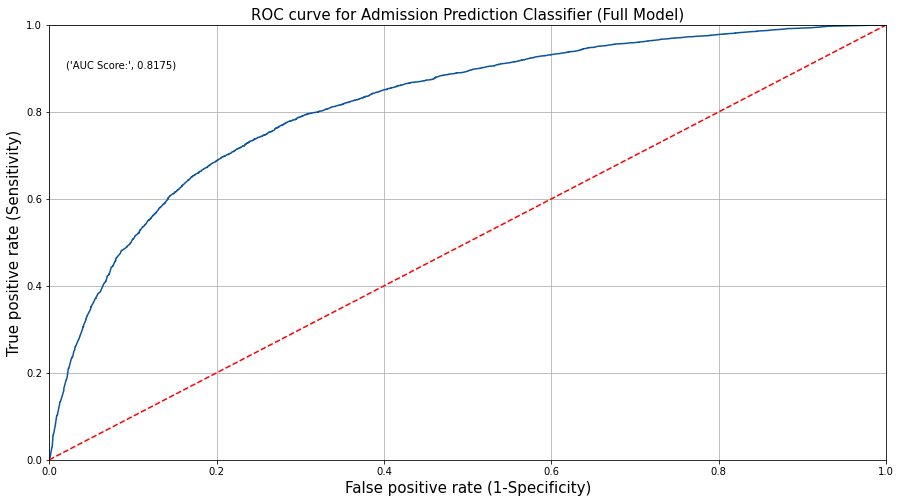

In [232]:
fpr, tpr, thresholds = roc_curve(y_test, y_test_prob)

plt.plot(fpr, tpr)

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])

plt.plot([0, 1], [0, 1],'r--')

plt.title('ROC curve for Admission Prediction Classifier (Full Model)', fontsize = 15)
plt.xlabel('False positive rate (1-Specificity)', fontsize = 15)
plt.ylabel('True positive rate (Sensitivity)', fontsize = 15)

plt.text(x = 0.02, y = 0.9, s = ('AUC Score:', round(metrics.roc_auc_score(y_test, y_test_prob),4)))
                               
plt.grid(True)

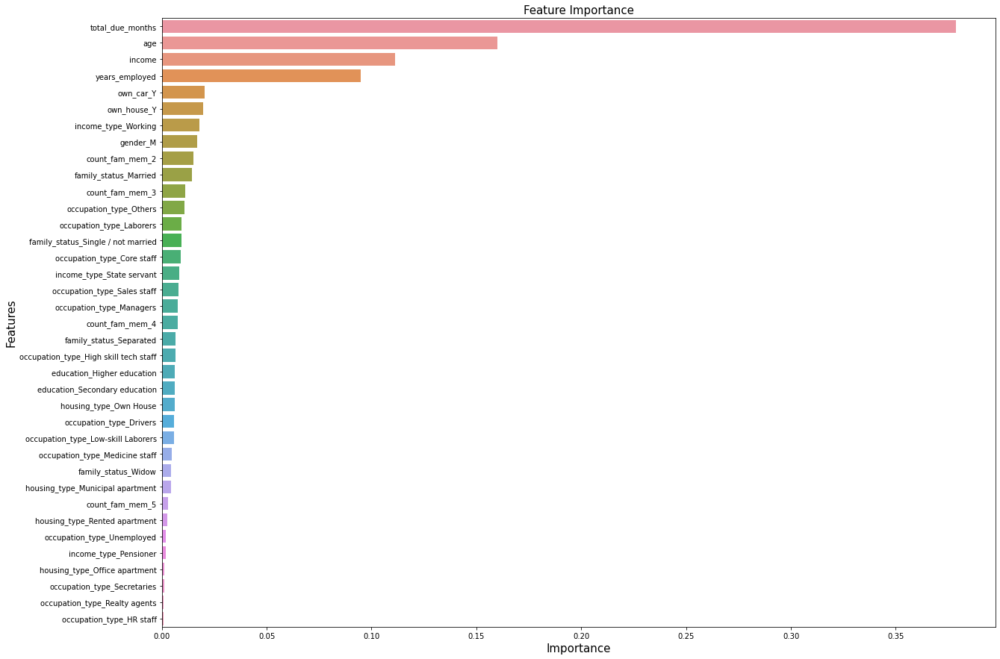

In [233]:
plt.figure(figsize=(20,15))

important_features = pd.DataFrame({'Features': X_train.columns, 
                                   'Importance': rf_grid.feature_importances_})

# sort the dataframe in the descending order according to the feature importance
important_features = important_features.sort_values('Importance', ascending = False)

# create a barplot to visualize the features based on their importance
sns.barplot(x = 'Importance', y = 'Features', data = important_features)

# add plot and axes labels
# set text size using 'fontsize'
plt.title('Feature Importance', fontsize = 15)
plt.xlabel('Importance', fontsize = 15)
plt.ylabel('Features', fontsize = 15)

# display the plot
plt.show()

### Decision Tree using Randomized Search

In [234]:
from scipy.stats import randint as sp_randint
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import roc_auc_score,accuracy_score,confusion_matrix

In [235]:
params={'max_depth':sp_randint(2,200),'min_samples_split':sp_randint(2,100),'min_samples_leaf':sp_randint(2,150), 
        'max_leaf_nodes':sp_randint(1,20), 'criterion':['gini','entropy']}

dtc=DecisionTreeClassifier()
rsearch=RandomizedSearchCV(dtc,param_distributions=params, n_iter=200, cv = 10, scoring='roc_auc' ,n_jobs=-1)

rsearch.fit(X_train,y_train)

RandomizedSearchCV(cv=10, estimator=DecisionTreeClassifier(), n_iter=200,
                   n_jobs=-1,
                   param_distributions={'criterion': ['gini', 'entropy'],
                                        'max_depth': <scipy.stats._distn_infrastructure.rv_frozen object at 0x0000029F71818550>,
                                        'max_leaf_nodes': <scipy.stats._distn_infrastructure.rv_frozen object at 0x0000029F6530C670>,
                                        'min_samples_leaf': <scipy.stats._distn_infrastructure.rv_frozen object at 0x0000029F6D1EBCD0>,
                                        'min_samples_split': <scipy.stats._distn_infrastructure.rv_frozen object at 0x0000029F65231100>},
                   scoring='roc_auc')

In [236]:
rsearch.best_params_

{'criterion': 'entropy',
 'max_depth': 108,
 'max_leaf_nodes': 17,
 'min_samples_leaf': 127,
 'min_samples_split': 73}

In [237]:
dtc = DecisionTreeClassifier(**rsearch.best_params_)
dtc.fit(X_train, y_train)

y_train_pred=dtc.predict(X_train)
y_train_prob=dtc.predict_proba(X_train)[:,1]

print('Accuracy score of train: ', accuracy_score(y_train,y_train_pred))
print('Confusion Matrix of train: ', confusion_matrix(y_train,y_train_pred))
print('Auc of train: ', roc_auc_score(y_train,y_train_prob))
print(classification_report(y_train,y_train_pred))

y_test_pred=dtc.predict(X_test)
y_test_prob=dtc.predict_proba(X_test)[:,1]

print('Accuracy score of test: ', accuracy_score(y_test,y_test_pred))
print('Confusion Matrix of test: ', confusion_matrix(y_test,y_test_pred))
print('Auc of test: ', roc_auc_score(y_test,y_test_prob))
print(classification_report(y_train,y_train_pred))

print("Best Params", rsearch.best_params_)

Accuracy score of train:  0.6960253998118533
Confusion Matrix of train:  [[9141 3117]
 [4638 8616]]
Auc of train:  0.7469113090238855
              precision    recall  f1-score   support

           0       0.66      0.75      0.70     12258
           1       0.73      0.65      0.69     13254

    accuracy                           0.70     25512
   macro avg       0.70      0.70      0.70     25512
weighted avg       0.70      0.70      0.70     25512

Accuracy score of test:  0.6929760380464606
Confusion Matrix of test:  [[3948 1329]
 [2028 3629]]
Auc of test:  0.745821057350651
              precision    recall  f1-score   support

           0       0.66      0.75      0.70     12258
           1       0.73      0.65      0.69     13254

    accuracy                           0.70     25512
   macro avg       0.70      0.70      0.70     25512
weighted avg       0.70      0.70      0.70     25512

Best Params {'criterion': 'entropy', 'max_depth': 108, 'max_leaf_nodes': 17, 'min_

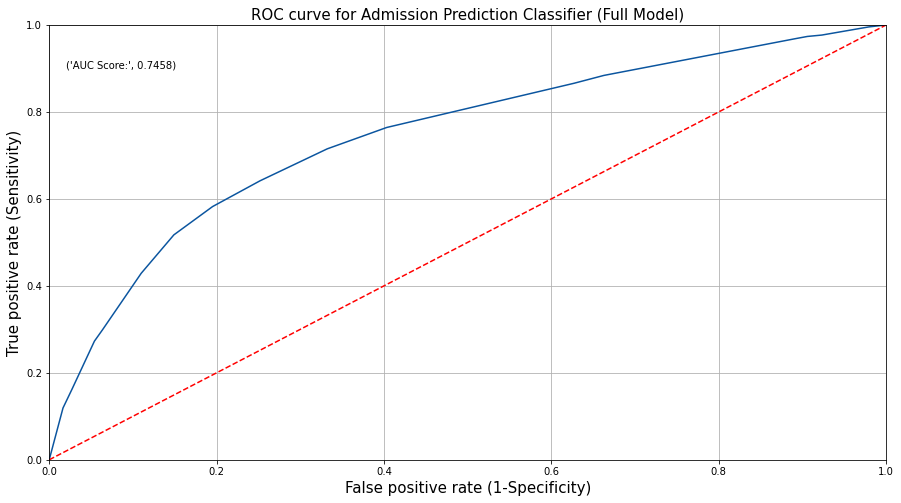

In [238]:
fpr, tpr, thresholds = roc_curve(y_test, y_test_prob)

plt.plot(fpr, tpr)

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])

plt.plot([0, 1], [0, 1],'r--')

plt.title('ROC curve for Admission Prediction Classifier (Full Model)', fontsize = 15)
plt.xlabel('False positive rate (1-Specificity)', fontsize = 15)
plt.ylabel('True positive rate (Sensitivity)', fontsize = 15)

plt.text(x = 0.02, y = 0.9, s = ('AUC Score:', round(metrics.roc_auc_score(y_test, y_test_prob),4)))
                               
plt.grid(True)

# LGBM

In [239]:
!pip install lightgbm

In [240]:
from lightgbm import LGBMClassifier

In [241]:
#x,y - original IV and DV

In [242]:
X = df_fin_model

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state = 10, test_size = 0.3)

# check the dimensions of the train & test subset using 'shape'
# print dimension of train set
print('X_train', X_train.shape)
print('y_train', y_train.shape)

# print dimension of test set
print('X_test', X_test.shape)
print('y_test', y_test.shape)

X_train (25512, 37)
y_train (25512,)
X_test (10934, 37)
y_test (10934,)


In [243]:
scaler = StandardScaler()

X_train[df_model_num] = scaler.fit_transform(X_train[df_model_num])

X_test[df_model_num] = scaler.fit_transform(X_test[df_model_num])

print('X_test', X_test.shape)
print('X_train', X_train.shape)

X_test (10934, 37)
X_train (25512, 37)


In [244]:
lgb=LGBMClassifier()
lgb.fit(X_train,y_train)
y_train_pred=lgb.predict(X_train)
y_train_prob=lgb.predict_proba(X_train)[:,1]

print('Accuracy score of train: ', accuracy_score(y_train,y_train_pred))
print('Confusion Matrix of train: ', confusion_matrix(y_train,y_train_pred))
print('Auc of train: ', roc_auc_score(y_train,y_train_prob))
print(classification_report(y_train,y_train_pred))

y_test_pred=lgb.predict(X_test)
y_test_prob=lgb.predict_proba(X_test)[:,1]
print('Accuracy score of test: ', accuracy_score(y_test,y_test_pred))
print('Confusion Matrix of test: ', confusion_matrix(y_test,y_test_pred))
print('Auc of test: ', roc_auc_score(y_test,y_test_prob))
print(classification_report(y_test,y_test_pred))

Accuracy score of train:  0.7409846346817184
Confusion Matrix of train:  [[9384 2874]
 [3734 9520]]
Auc of train:  0.8282101527830188
              precision    recall  f1-score   support

           0       0.72      0.77      0.74     12258
           1       0.77      0.72      0.74     13254

    accuracy                           0.74     25512
   macro avg       0.74      0.74      0.74     25512
weighted avg       0.74      0.74      0.74     25512

Accuracy score of test:  0.7101701115785622
Confusion Matrix of test:  [[3933 1344]
 [1825 3832]]
Auc of test:  0.7764514954095688
              precision    recall  f1-score   support

           0       0.68      0.75      0.71      5277
           1       0.74      0.68      0.71      5657

    accuracy                           0.71     10934
   macro avg       0.71      0.71      0.71     10934
weighted avg       0.71      0.71      0.71     10934



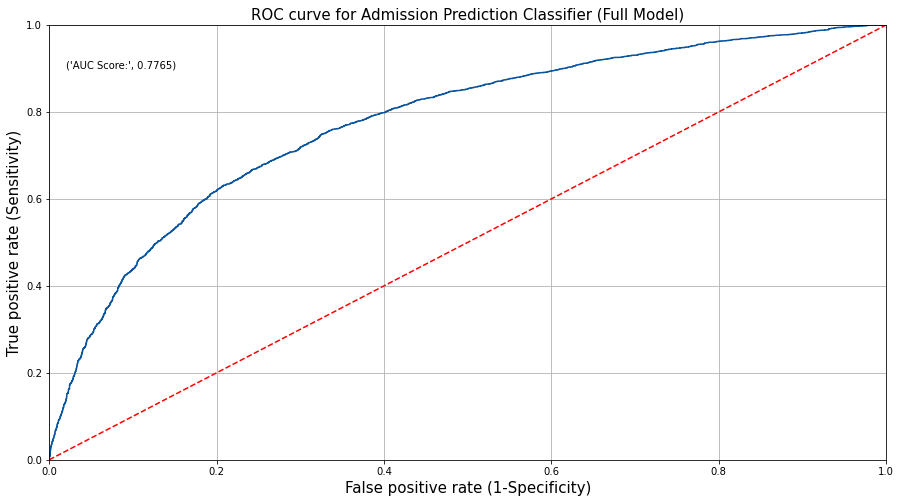

In [245]:
fpr, tpr, thresholds = roc_curve(y_test, y_test_prob)

plt.plot(fpr, tpr)

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])

plt.plot([0, 1], [0, 1],'r--')

plt.title('ROC curve for Admission Prediction Classifier (Full Model)', fontsize = 15)
plt.xlabel('False positive rate (1-Specificity)', fontsize = 15)
plt.ylabel('True positive rate (Sensitivity)', fontsize = 15)

plt.text(x = 0.02, y = 0.9, s = ('AUC Score:', round(metrics.roc_auc_score(y_test, y_test_prob),4)))
                               
plt.grid(True)

### LGBM WITH HYPERPARAMETER TUNING

In [246]:
X_train.head()

,age,income,years_employed,total_due_months,gender_M,own_car_Y,own_house_Y,income_type_Pensioner,income_type_State servant,income_type_Working,...,occupation_type_Medicine staff,occupation_type_Others,occupation_type_Realty agents,occupation_type_Sales staff,occupation_type_Secretaries,occupation_type_Unemployed,count_fam_mem_2,count_fam_mem_3,count_fam_mem_4,count_fam_mem_5
393,0.736532,-1.518204,1.677466,0.925986,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
42691,-0.670614,-0.518242,0.717963,1.182895,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,1,0
14330,1.692001,-1.276834,-1.177921,-1.129287,0,1,1,1,0,0,...,0,0,0,0,0,1,1,0,0,0
31919,1.961270,-0.587205,-1.177921,0.733304,0,0,1,1,0,0,...,0,0,0,0,0,1,0,0,0,0
11099,0.128506,-1.345797,-0.623028,-0.551241,0,0,1,0,0,1,...,0,0,0,0,0,0,0,1,0,0


In [247]:
from scipy.stats import randint as sp_randint
from scipy.stats import uniform as sp_uniform
lgb=LGBMClassifier()
params={'n_estimators': sp_randint(50,200), 'num_leaves':sp_randint(10,50),'max_depth':sp_randint(2,15),
        'learning_rate':sp_uniform(0,1),'min_child_samples':(2,50)}
rsearch=RandomizedSearchCV(estimator=lgb,param_distributions=params,cv=3,scoring='roc_auc',n_jobs=-1,random_state=1,n_iter=100)
rsearch.fit(X,y)
lgb=LGBMClassifier(**rsearch.best_params_)
lgb.fit(X_train,y_train)
y_train_pred=lgb.predict(X_train)
y_train_prob=lgb.predict_proba(X_train)[:,1]

print('Accuracy score of train: ', accuracy_score(y_train,y_train_pred))
print('Confusion Matrix of train: ', confusion_matrix(y_train,y_train_pred))
print('Auc of train: ', roc_auc_score(y_train,y_train_prob))
print(classification_report(y_train,y_train_pred))

y_test_pred=lgb.predict(X_test)
y_test_prob=lgb.predict_proba(X_test)[:,1]
print('Accuracy score of test: ', accuracy_score(y_test,y_test_pred))
print('Confusion Matrix of test: ', confusion_matrix(y_test,y_test_pred))
print('Auc of test: ', roc_auc_score(y_test,y_test_prob))
print(classification_report(y_test,y_test_pred))

Accuracy score of train:  0.7066870492317341
Confusion Matrix of train:  [[9112 3146]
 [4337 8917]]
Auc of train:  0.7666160122380636
              precision    recall  f1-score   support

           0       0.68      0.74      0.71     12258
           1       0.74      0.67      0.70     13254

    accuracy                           0.71     25512
   macro avg       0.71      0.71      0.71     25512
weighted avg       0.71      0.71      0.71     25512

Accuracy score of test:  0.6956283153466252
Confusion Matrix of test:  [[3893 1384]
 [1944 3713]]
Auc of test:  0.7560218851748874
              precision    recall  f1-score   support

           0       0.67      0.74      0.70      5277
           1       0.73      0.66      0.69      5657

    accuracy                           0.70     10934
   macro avg       0.70      0.70      0.70     10934
weighted avg       0.70      0.70      0.70     10934



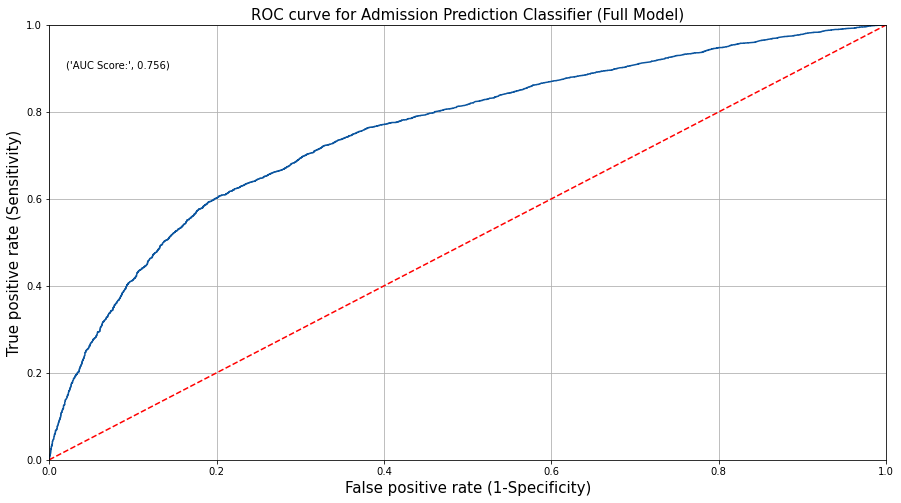

In [248]:
fpr, tpr, thresholds = roc_curve(y_test, y_test_prob)

plt.plot(fpr, tpr)

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])

plt.plot([0, 1], [0, 1],'r--')

plt.title('ROC curve for Admission Prediction Classifier (Full Model)', fontsize = 15)
plt.xlabel('False positive rate (1-Specificity)', fontsize = 15)
plt.ylabel('True positive rate (Sensitivity)', fontsize = 15)

plt.text(x = 0.02, y = 0.9, s = ('AUC Score:', round(metrics.roc_auc_score(y_test, y_test_prob),4)))
                               
plt.grid(True)

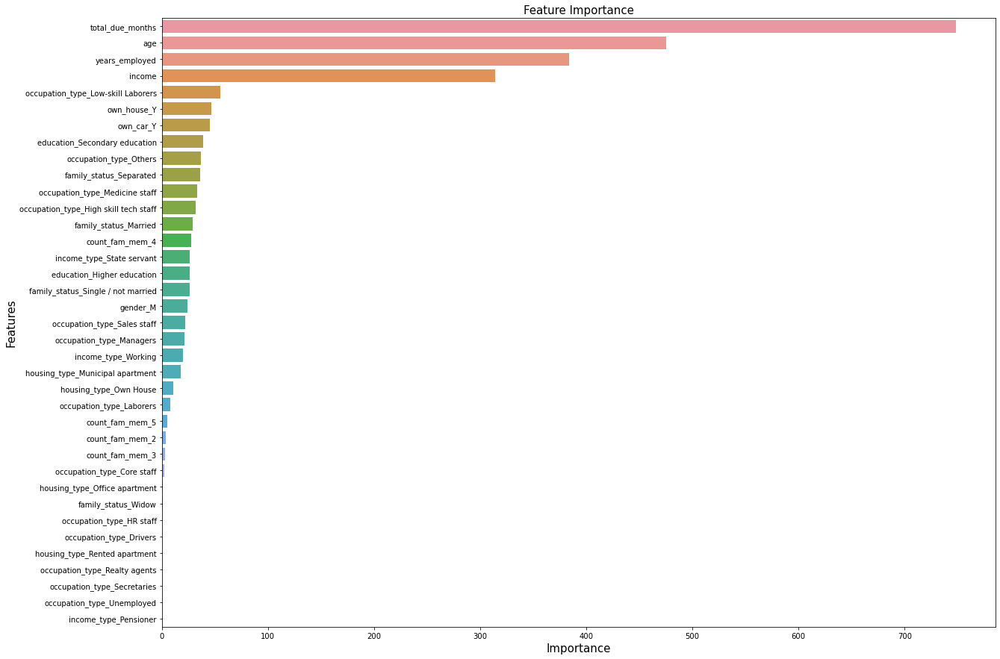

In [249]:
plt.figure(figsize=(20,15))

important_features = pd.DataFrame({'Features': X_train.columns, 
                                   'Importance': lgb.feature_importances_})

# sort the dataframe in the descending order according to the feature importance
important_features = important_features.sort_values('Importance', ascending = False)

# create a barplot to visualize the features based on their importance
sns.barplot(x = 'Importance', y = 'Features', data = important_features)

# add plot and axes labels
# set text size using 'fontsize'
plt.title('Feature Importance', fontsize = 15)
plt.xlabel('Importance', fontsize = 15)
plt.ylabel('Features', fontsize = 15)

# display the plot
plt.show()

### SUPPORT VECTOR MACHINE FOR CLASSIFICATION

In [250]:
print('X_test', X_test.shape)
print('X_train', X_train.shape)

X_test (10934, 37)
X_train (25512, 37)


In [259]:
from sklearn import svm
from sklearn.svm import SVC

In [260]:
model = SVC(kernel='poly', degree=8,probability=True)
model.fit(X_train, y_train)

SVC(degree=8, kernel='poly', probability=True)

In [261]:
y_pred_svm= model.predict(X_test)  

In [262]:
y_pred_svm[:5]

array([0, 0, 0, 0, 0], dtype=int64)

In [263]:
y_train_pred_svm= model.predict(X_train)  

In [264]:
y_test_prob=model.predict_proba(X_test)[:,1]

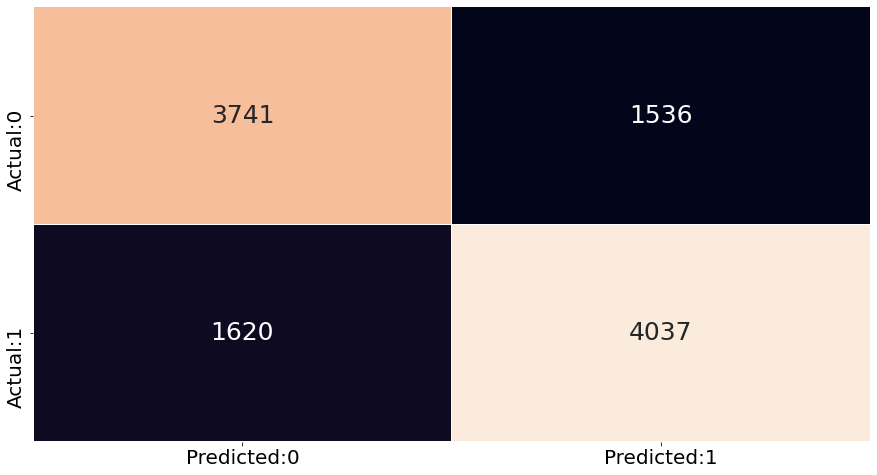

In [265]:
cm = confusion_matrix(y_test, y_pred_svm)

conf_matrix = pd.DataFrame(data = cm,columns = ['Predicted:0','Predicted:1'], index = ['Actual:0','Actual:1'])
 
sns.heatmap(conf_matrix, annot = True, fmt = 'd', cbar = False, 
            linewidths = 0.1, annot_kws = {'size':25})

plt.xticks(fontsize = 20)

plt.yticks(fontsize = 20)

plt.show()

In [266]:
print(classification_report(y_test, y_pred_svm))

              precision    recall  f1-score   support

           0       0.70      0.71      0.70      5277
           1       0.72      0.71      0.72      5657

    accuracy                           0.71     10934
   macro avg       0.71      0.71      0.71     10934
weighted avg       0.71      0.71      0.71     10934



In [267]:
print(classification_report(y_train, y_train_pred_svm))

              precision    recall  f1-score   support

           0       0.79      0.81      0.80     12258
           1       0.82      0.81      0.81     13254

    accuracy                           0.81     25512
   macro avg       0.81      0.81      0.81     25512
weighted avg       0.81      0.81      0.81     25512



In [268]:
from sklearn.naive_bayes import BernoulliNB

In [269]:
gnb = BernoulliNB(binarize=0.0)

# fit the model using fit() on train data
gnb_model = gnb.fit(X_train, y_train)

In [270]:
y_pred =  gnb_model.predict(X_test)

In [271]:
y_test_prob=gnb_model.predict_proba(X_test)[:,1]

In [272]:
y_train_prob=gnb_model.predict_proba(X_train)[:,1]

In [273]:
round(metrics.roc_auc_score(y_train, y_train_prob),4)

0.7061

In [274]:
y_train_pred =  gnb_model.predict(X_train)

In [275]:
print(classification_report(y_train, y_train_pred))

              precision    recall  f1-score   support

           0       0.65      0.76      0.71     12258
           1       0.74      0.63      0.68     13254

    accuracy                           0.69     25512
   macro avg       0.70      0.70      0.69     25512
weighted avg       0.70      0.69      0.69     25512



In [276]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.66      0.77      0.71      5277
           1       0.74      0.63      0.68      5657

    accuracy                           0.69     10934
   macro avg       0.70      0.70      0.69     10934
weighted avg       0.70      0.69      0.69     10934



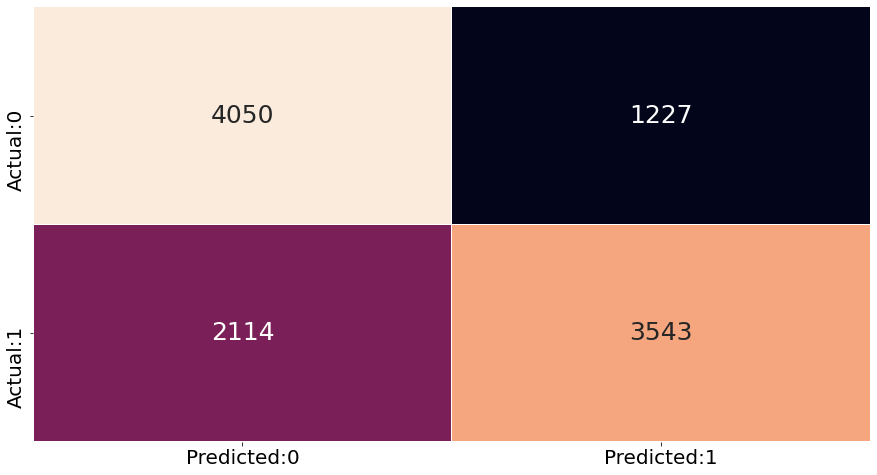

In [277]:
cm = confusion_matrix(y_test, y_pred)

conf_matrix = pd.DataFrame(data = cm,columns = ['Predicted:0','Predicted:1'], index = ['Actual:0','Actual:1'])
 
sns.heatmap(conf_matrix, annot = True, fmt = 'd', cbar = False, 
            linewidths = 0.1, annot_kws = {'size':25})

plt.xticks(fontsize = 20)

plt.yticks(fontsize = 20)

plt.show()

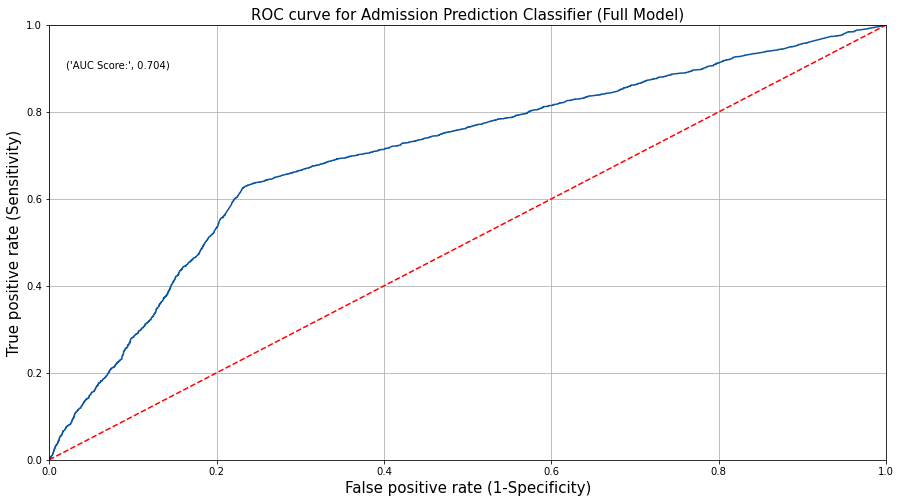

In [278]:
fpr, tpr, thresholds = roc_curve(y_test, y_test_prob)

plt.plot(fpr, tpr)

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])

plt.plot([0, 1], [0, 1],'r--')

plt.title('ROC curve for Admission Prediction Classifier (Full Model)', fontsize = 15)
plt.xlabel('False positive rate (1-Specificity)', fontsize = 15)
plt.ylabel('True positive rate (Sensitivity)', fontsize = 15)
    
plt.text(x = 0.02, y = 0.9, s = ('AUC Score:', round(metrics.roc_auc_score(y_test, y_test_prob),4)))
                               
plt.grid(True)

CONCLUSION:
    
In this project Credit Card prediction approval we have implemented various techniques and models  performed on the dataset to improve over the primary data-set. Among the models built Naive Baye’s and Light Gradient Boosting Machine with hyper-parameter tuned using features (‘age’,’years_employed’,’income’,’total_due_months’) performed well giving good train and test accuracy.

Additional features like cibil score and credit amount can be included as per the business requirement to build the model which will boost the model results. These are the features we will look at in future our model could have performed well if we have additional features.
